In [1]:
# обновления используемых библиотек
!pip install -q phik
!pip install plotly --upgrade -q
!pip install --upgrade -q scikit-learn
!pip install -q optuna
!pip install -q optuna-integration
!pip install -q mlxtend
!pip install -q shap
#!pip install --upgrade -q matplotlib

# Импорт из стандартной библиотеки
import os
from functools import reduce
from itertools import combinations

# Стандартные библиотеки для научных вычислений
import numpy as np
import pandas as pd

# Визуализация данных
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import shap

# Расчет статистик
from sklearn.metrics import (
    accuracy_score, 
    classification_report,
    confusion_matrix,
    f1_score, 
    mean_absolute_error, 
    mean_squared_error, 
    precision_score,
    recall_score, 
    roc_auc_score,
    roc_curve,
    precision_recall_curve,
)
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.impute import SimpleImputer
from sklearn.metrics import ConfusionMatrixDisplay, PrecisionRecallDisplay, r2_score
from sklearn.model_selection import (
    train_test_split, 
    cross_val_score, 
    RandomizedSearchCV, 
    GridSearchCV,
)
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import (
    OneHotEncoder,
    LabelEncoder,
    OrdinalEncoder, 
    StandardScaler, 
    MinMaxScaler,
    RobustScaler,
)

# Модели машинного обучения
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# Дополнительные библиотеки для анализа данных
from mlxtend.plotting import plot_decision_regions
from optuna import distributions
from optuna.integration import OptunaSearchCV
from phik import phik_matrix
from phik.report import plot_correlation_matrix

# Настройка отображения графиков
%matplotlib inline
sns.set(
    font_scale=1.3,
    style="whitegrid",
    rc={'figure.figsize':(20,7)}
)

# Настройка для графиков SHAP
shap.initjs()

# Константы
RANDOM_STATE = 42
TEST_SIZE = 0.25
NSAMPLES = 20


#  Введение



В нашем распоряжении данные о покупателях, их продуктовом поведении, выручке магазина и времени проведенными пользователями на сайте от Интернет-магазина «В один клик».

Наша цель проанализировать эти данные и при помощи моделей машинного обучения и персонализировать предложения постоянным клиентам, чтобы увеличить их покупательскую активность.

План нашего проекта такой:

1) Прочитаем данные, изучим проблемы в них

2) В случае наличия проблем, обработаем их

3) Проведем исследовательский анализ данных и изучим информацию о коровах

4) Объеденим наши датасеты

5) Проведем корреляционный анализ данных и изучим завимости

6) Выберем лучшую модель для нашей задачи при помощи пайплайнов.

7) Проанализируем важность признаков методом SHAP

8) Сегментируем группу покупателей и предложим как увеличить покупательскую активность.

## Загрузка данных

Загрузим датасеты и изучим в данные, которые в них представлены. Создадим функцию для чтения датасетов:


In [2]:
def read_file(name, sim_1, sim_2):
    try:
        return pd.read_csv(name, sep=sim_1, decimal=sim_2)
    except:
        return pd.read_csv('https://code.s3.yandex.net'+name, sep=sim_1, decimal=sim_2)

Запишем получившиеся датасеты в переменные `data_market_file`, `data_market_money`, `data_market_time`, `data_money` и изучим информацию о них:

In [3]:
data_market_file = read_file('/datasets/market_file.csv', ',', ',')
data_market_file.head()

,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.0,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2


In [4]:
data_market_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   id                                   1300 non-null   int64 
 1   Покупательская активность            1300 non-null   object
 2   Тип сервиса                          1300 non-null   object
 3   Разрешить сообщать                   1300 non-null   object
 4   Маркет_актив_6_мес                   1300 non-null   object
 5   Маркет_актив_тек_мес                 1300 non-null   int64 
 6   Длительность                         1300 non-null   int64 
 7   Акционные_покупки                    1300 non-null   object
 8   Популярная_категория                 1300 non-null   object
 9   Средний_просмотр_категорий_за_визит  1300 non-null   int64 
 10  Неоплаченные_продукты_штук_квартал   1300 non-null   int64 
 11  Ошибка_сервиса                       1300 n

In [5]:
data_market_money = read_file('/datasets/market_money.csv', ',', ',')
data_market_money.head()

,id,Период,Выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6


In [6]:
data_market_money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       3900 non-null   int64 
 1   Период   3900 non-null   object
 2   Выручка  3900 non-null   object
dtypes: int64(1), object(2)
memory usage: 91.5+ KB


In [7]:
data_market_time = read_file('/datasets/market_time.csv', ',', ',')
data_market_time.head()

,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13


In [8]:
data_market_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   Период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB


In [9]:
data_money = read_file('/datasets/money.csv', ';', ',')
data_money.head()

,id,Прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21


In [10]:
data_money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int64  
 1   Прибыль  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB


Датасеты успешно загружены и изучены. Выявлено, что часть конолок имеет неправильный тип, из-за чего в дальнейшем возможность анализировать количественные данные будет трудно. Также для придания общепринятого вида измением названия колонок в каждом датасете.

Можно приступать к предобработке данных.

## Предобработка данных

Начнем с переимнования столбцов, которые написаны на русском. Приведем к общему виду и переименуем каждый и изучим результат:

In [11]:
data_market_file.columns = ['id', 'buying_activity', 'service_type', 'allow_reporting', 'market_active_6_months', 'market_active_current_month', 'duration', 'promotional_purchases', 'popular_category', 'average_category_view_visit', 'unpaid_products_items_q', 'service_error', 'pages_per_visit']
data_market_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   id                           1300 non-null   int64 
 1   buying_activity              1300 non-null   object
 2   service_type                 1300 non-null   object
 3   allow_reporting              1300 non-null   object
 4   market_active_6_months       1300 non-null   object
 5   market_active_current_month  1300 non-null   int64 
 6   duration                     1300 non-null   int64 
 7   promotional_purchases        1300 non-null   object
 8   popular_category             1300 non-null   object
 9   average_category_view_visit  1300 non-null   int64 
 10  unpaid_products_items_q      1300 non-null   int64 
 11  service_error                1300 non-null   int64 
 12  pages_per_visit              1300 non-null   int64 
dtypes: int64(7), object(6)
memory usa

In [12]:
data_market_money.columns = ['id', 'period', 'revenue']
data_market_money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       3900 non-null   int64 
 1   period   3900 non-null   object
 2   revenue  3900 non-null   object
dtypes: int64(1), object(2)
memory usage: 91.5+ KB


In [13]:
data_market_time.columns = ['id', 'period', 'minutes']
data_market_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   id       2600 non-null   int64 
 1   period   2600 non-null   object
 2   minutes  2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB


In [14]:
data_money.columns = ['id', 'profit']
data_money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      1300 non-null   int64  
 1   profit  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB


Отлично, названия колонок приведены к общепринятому виду. Можно приступать к изменению типа колонок.

In [15]:
data_market_file['market_active_6_months'] = data_market_file['market_active_6_months'].astype(float)
data_market_file['promotional_purchases'] = data_market_file['promotional_purchases'].astype(float)
data_market_money['revenue'] = data_market_money['revenue'].astype(float)

Изучим информацию о изменных датасетах:

In [16]:
data_market_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           1300 non-null   int64  
 1   buying_activity              1300 non-null   object 
 2   service_type                 1300 non-null   object 
 3   allow_reporting              1300 non-null   object 
 4   market_active_6_months       1300 non-null   float64
 5   market_active_current_month  1300 non-null   int64  
 6   duration                     1300 non-null   int64  
 7   promotional_purchases        1300 non-null   float64
 8   popular_category             1300 non-null   object 
 9   average_category_view_visit  1300 non-null   int64  
 10  unpaid_products_items_q      1300 non-null   int64  
 11  service_error                1300 non-null   int64  
 12  pages_per_visit              1300 non-null   int64  
dtypes: float64(2), int

In [17]:
data_market_money.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int64  
 1   period   3900 non-null   object 
 2   revenue  3900 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.5+ KB


Типы данных изменны. Для дальнейшей проверки на дубликаты и прописки напишем общую функцию для оптимизации кода:

In [18]:
def check_data(row):
    display(row.isna().sum())
    display(row.duplicated().sum())

In [19]:
check_data(data_market_file)

id                             0
buying_activity                0
service_type                   0
allow_reporting                0
market_active_6_months         0
market_active_current_month    0
duration                       0
promotional_purchases          0
popular_category               0
average_category_view_visit    0
unpaid_products_items_q        0
service_error                  0
pages_per_visit                0
dtype: int64

0

В датасете с информацией о поведении покупателя на сайте, о коммуникациях с покупателем и его продуктовом поведении отсутствуют пропуски и дубликаты.

In [20]:
check_data(data_market_money)

id         0
period     0
revenue    0
dtype: int64

0

Также и в датасете с информацией о выручке, которую получает магазин с покупателя нет дубликатов и пропусков.

In [21]:
check_data(data_market_time)

id         0
period     0
minutes    0
dtype: int64

0

Отлично. В датасете с данными о времени (в минутах), которое покупатель провёл на сайте в течение периода тоже нет ни дубликатов, ни пропусков 

In [22]:
check_data(data_money)

id        0
profit    0
dtype: int64

0

И наконец в последнием датасете с данными о среднемесячной прибыли покупателя за последние 3 месяца тоже все хорошо.

На этапе предобработки данных были изменены и приведены к общепринятому виду названия колонок. Также был исправлен некорректный тип колонок у части датасетов. 

При проверке на дубликаты и пропуски - все датасеты оказались без них!

Можно приступать к исследовательскому анализу данных.

##  Исследовательский анализ данных

Исследуем данные, статистические данные о датасета, учитывая только покупателей с активность не более 3 месяцев:

In [23]:
data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0].describe().T

,count,mean,std,min,25%,50%,75%,max
id,1300.0,215997.500000,375.421985,215348.00,215672.75,215997.500,216322.25,216647.00
market_active_6_months,1300.0,4.253769,1.014814,0.90,3.70,4.200,4.90,6.60
market_active_current_month,1300.0,4.011538,0.696868,3.00,4.00,4.000,4.00,5.00
duration,1300.0,601.898462,249.856289,110.00,405.50,606.000,806.00,1079.00
promotional_purchases,1300.0,0.319808,0.249843,0.00,0.17,0.240,0.30,0.99
average_category_view_visit,1300.0,3.270000,1.355350,1.00,2.00,3.000,4.00,6.00
unpaid_products_items_q,1300.0,2.840000,1.971451,0.00,1.00,3.000,4.00,10.00
service_error,1300.0,4.185385,1.955298,0.00,3.00,4.000,6.00,9.00
pages_per_visit,1300.0,8.176923,3.978126,1.00,5.00,8.000,11.00,20.00
profit,1300.0,3.996631,1.013722,0.86,3.30,4.045,4.67,7.43


В датасете с информацией о поведении покупателя на сайте, о коммуникациях с покупателем и его продуктовом поведении при проведении статистического анализа не замечено сильных отколнений. Изучим следующий датасет:

In [24]:
data_market_money.merge(data_money, on='id')[data_market_money.merge(data_money, on='id')['profit']>0].describe().T

,count,mean,std,min,25%,50%,75%,max
id,3900.0,215997.500000,375.325686,215348.00,215672.75,215997.500,216322.25,216647.00
revenue,3900.0,5025.696051,1777.704104,0.00,4590.15,4957.500,5363.00,106862.20
profit,3900.0,3.996631,1.013462,0.86,3.30,4.045,4.67,7.43


В данных с информацией о выручке, которую получает магазин с покупателя есть аномальные значения в колонке с выручкой. Более подробно изучим эти данные чуть позже, построив графики.

In [25]:
data_market_time.merge(data_money, on='id')[data_market_time.merge(data_money, on='id')['profit']>0].describe().T

,count,mean,std,min,25%,50%,75%,max
id,2600.0,215997.500000,375.349754,215348.00,215672.75,215997.500,216322.25,216647.00
minutes,2600.0,13.336154,4.080198,4.00,10.00,13.000,16.00,23.00
profit,2600.0,3.996631,1.013527,0.86,3.30,4.045,4.67,7.43


В датасете с информацией о времени (в минутах), которое покупатель провёл на сайте в течение периода также нет аномалий.

Можно приступать к построению графиков, гистограмм и ящиков с усами. Начнем с количественных признаков каждого из датасетов. Для этого напишем функцию для того, чтобы строить гистограмму и ящик с усами:

In [26]:
def hist_num(data_row, name_hist, name_box):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
    data_row.plot(kind='hist', bins=10, ax=axes[0], grid=True)
    axes[0].set_title(name_hist)
    plt.grid(True)
    data_row.plot(kind='box', ax=axes[1], rot=45, grid=True)
    axes[1].set_title(name_box)
    plt.show()

Начнем с распределения значений маркетинговых коммуникаций компании:

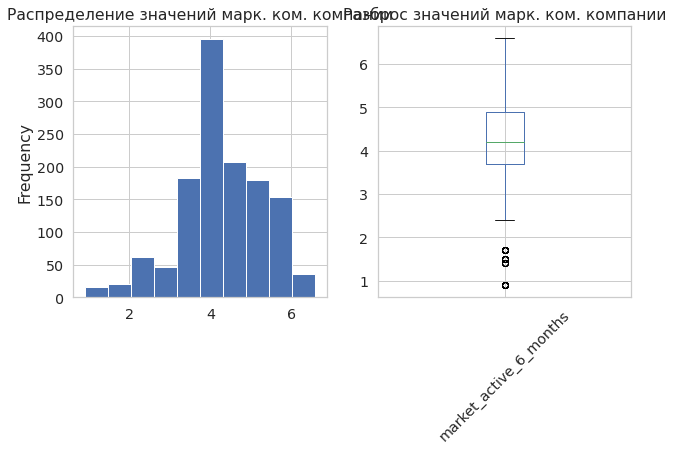

In [27]:
hist_num(data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0]['market_active_6_months'], 'Распределение значений марк. ком. компании', 'Разброс значений марк. ком. компании')

Как мы видим по гистограмме и разбросу - есть редкие выбросы со значениями в пределах 0 до двух. Чаще всего значения маркетинговых комуникаций колеблются в пределах от 3 до 5.

Изучим информацию о распределении количества маркетинговых компаний в этом месяце:

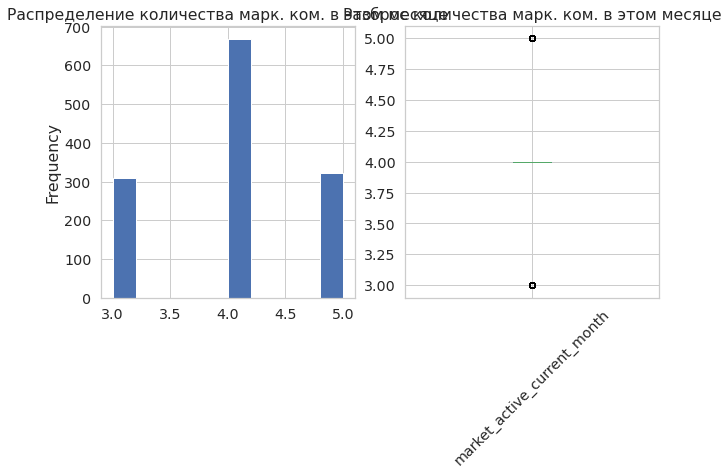

In [28]:
hist_num(data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0]['market_active_current_month'], 'Распределение количества марк. ком. в этом месяце', 'Разброс количества марк. ком. в этом месяце')

Значения распределились на 3, 4, 5. Чаще всего маркетинговых компаний было 4 - половина данных. Оставшаяся половина равномерно распределена между 3 и 5.

Следующем рассмотрим информацию о том, сколько дней прошло с момента регистрации покупателя на сайте:

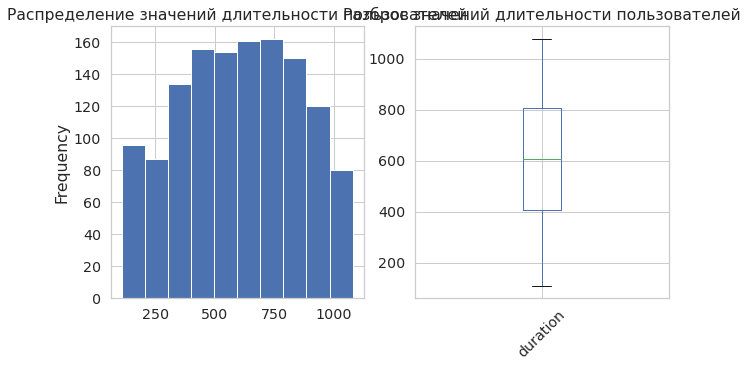

In [29]:
hist_num(data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0]['duration'], 'Распределение значений длительности пользователей', 'Разброс значений длительности пользователей')

Исходя из получившейся гистограммы чаще всего количество дней с момента регистрации на сайте составляет от 400 до 800 дней. Реже 200 или 1000. Как таковые выбросы отсутствуют.

Следующим показателем изучим среднемесячную долю покупок по акции от общего числа покупок за последние 6 месяцев:

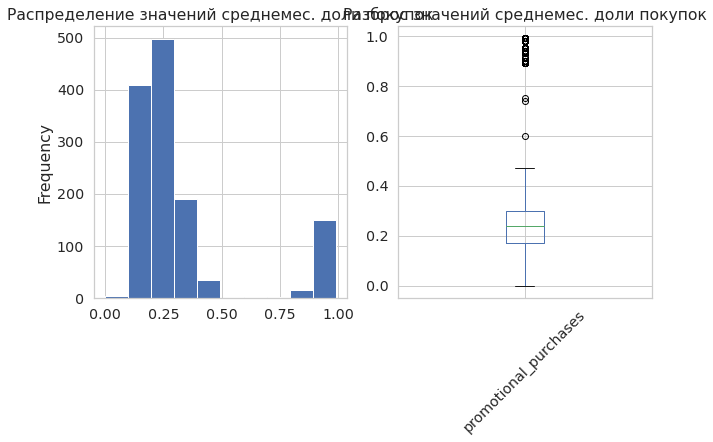

In [30]:
hist_num(data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0]['promotional_purchases'], 'Распределение значений среднемес. доли покупок', 'Разброс значений среднемес. доли покупок')

Чаще всего доля составляет от до 0.2 до 0.3. Значения с долей 0.5 или 0.6 - отсутствуют. Однако есть пользователи, которые отображены на ящеке с усами как выбросы с долей от 0.8 до 1.0 и их не аномально мало.

Приступим к изучении показателя о среднем количестве категорий, которые покупатель посмотрел за последний визит.

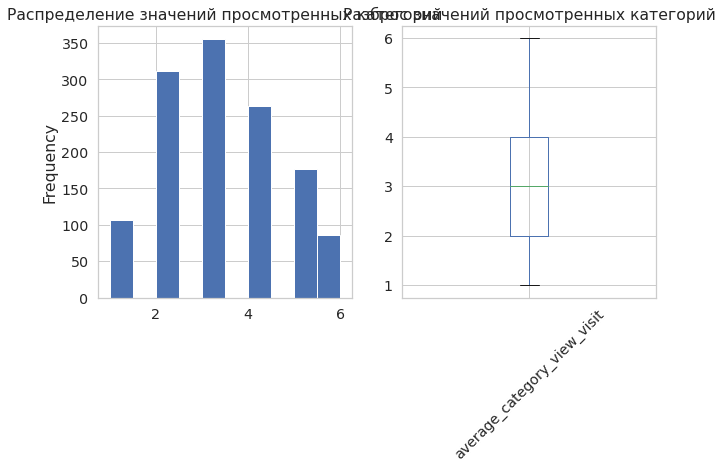

In [31]:
hist_num(data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0]['average_category_view_visit'], 'Распределение значений просмотренных категорий', 'Разброс значений просмотренных категорий')

Гистограмма правильная, в форме колокола. Выбросов также нет. Чаще всего пользователи просматривали от 2 до 4 категорий.

Рассмотрим количество неоплаченных товаров в корзине за последние 3 месяца:

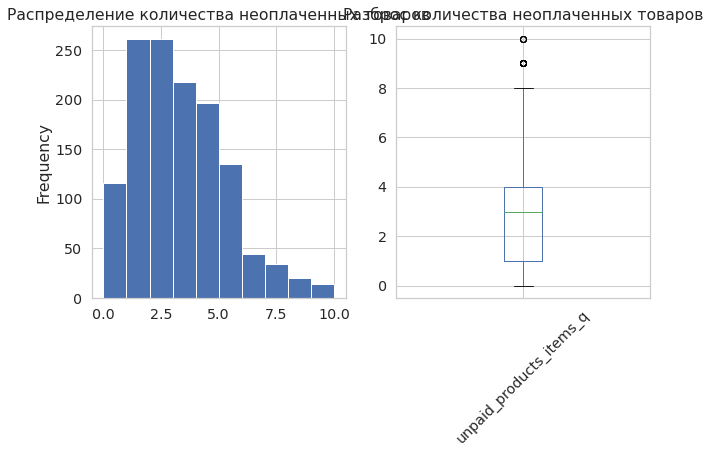

In [32]:
hist_num(data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0]['unpaid_products_items_q'], 'Распределение количества неоплаченных товаров', 'Разброс количества неоплаченных товаров')

В показателе с информацией о количестве неоплаченных товар есть выбросы с количеством от 8 до 10. По гистограмме видно, что чаще количество неоплаченных товаров составляет от 1 до 5, остальное реже.

Приступим и изучения распределения ошибок сервиса, с которыми покупатели столкнулись во время посещения сайта:

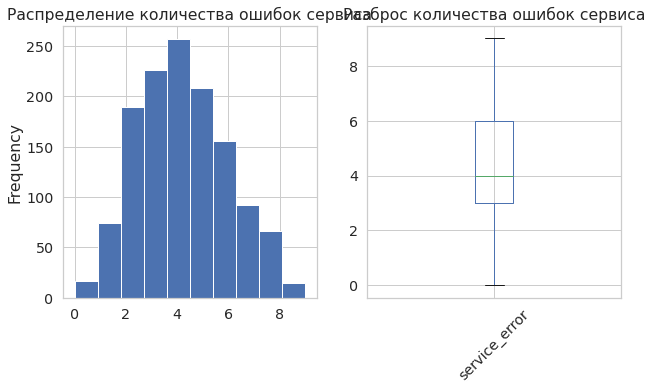

In [33]:
hist_num(data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0]['service_error'], 'Распределение количества ошибок сервиса', 'Разброс количества ошибок сервиса')

Гистограмма опять правильная, среднее количество ошибок сервиса - от 2 до 5, реже остальные. Выбросов нет.

Наконец, изучим последний количественный показатель этого датасета - среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца:

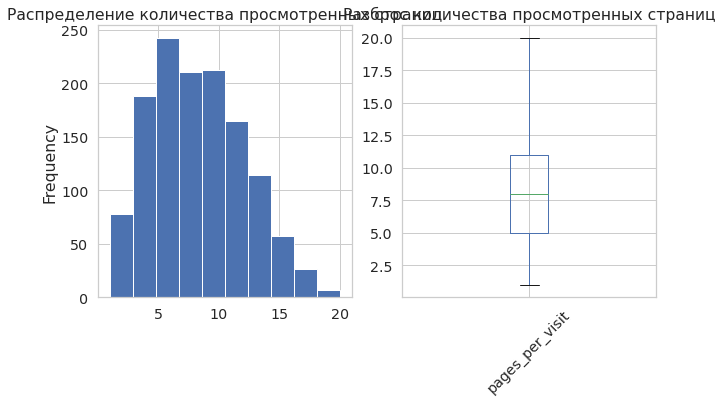

In [34]:
hist_num(data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0]['pages_per_visit'], 'Распределение количества просмотренных страниц', 'Разброс количества просмотренных страниц')

Гистограмма снова почти правильная, с небольшим отколнением в большую сторону. Чаще всего пользователи просматривают от 5 до 12 страниц, и очень редко 15 или больше.

Следующий датасет для анализа - данные о времени (в минутах), которое покупатель провёл на сайте в течение периода. Количественный показатель тут один - количество минут проведенного на сайте. Изучим его:

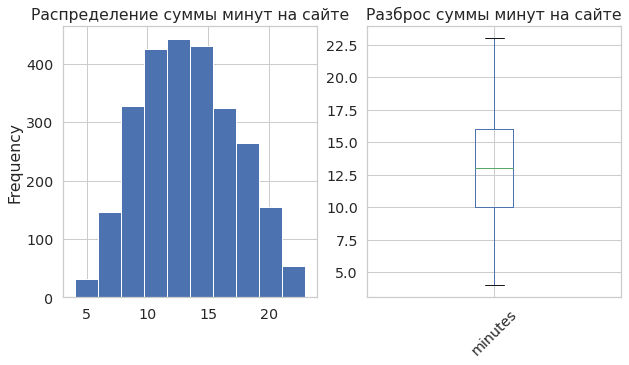

In [35]:
hist_num(data_market_time.merge(data_money, on='id')[data_market_time.merge(data_money, on='id')['profit']>0]['minutes'], 'Распределение суммы минут на сайте', 'Разброс суммы минут на сайте')

Гистограмма в форме колокола - это хорошо. Аномальных значений и выбросов нет, среднее значение в пределах от 10 до 17 минут, значения больше или меньше - реже.

Следующий датасет для анализа - данные о выручке, которую получает магазин с покупателя, то есть сколько покупатель всего потратил за период взаимодействия с сайтом. Рассмотрим его:

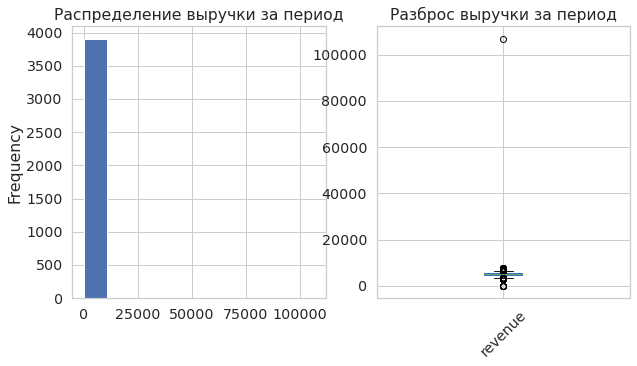

In [36]:
hist_num(data_market_money.merge(data_money, on='id')[data_market_money.merge(data_money, on='id')['profit']>0]['revenue'], 'Распределение выручки за период', 'Разброс выручки за период')

Гистограмма с распределением выручки аномальные выбросы за границей 100 тыс. рублей. Его лучше удалить, т.к. он может помешать обучать модель, а также такое значение очень сильно выбивается из выборки. Уберем его и снова построим графики:

In [37]:
data_market_money = data_market_money[data_market_money['revenue']<20000]

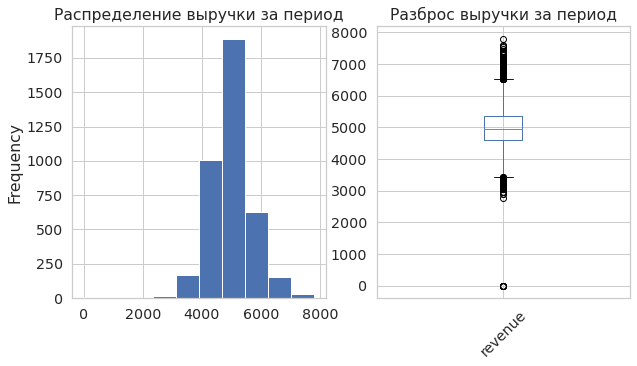

In [38]:
hist_num(data_market_money.merge(data_money, on='id')[data_market_money.merge(data_money, on='id')['profit']>0]['revenue'], 'Распределение выручки за период', 'Разброс выручки за период')

Отлично, но теперь появились пользователи с очень низкой выручкой. Их снова очень мало. Предлагаю их также удалить, для того что сделать данные более типичными и построить после снова гистограмму:

In [39]:
data_market_money = data_market_money[data_market_money['revenue']>2000]

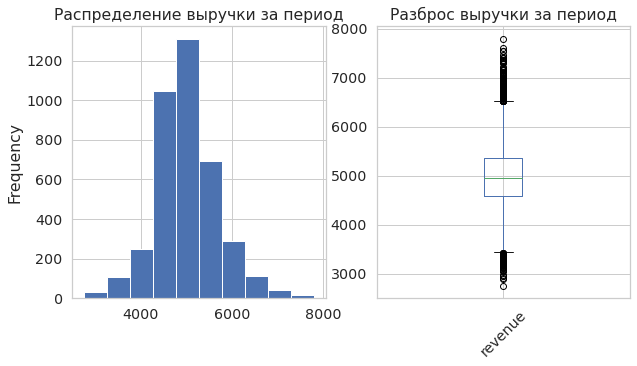

In [40]:
hist_num(data_market_money.merge(data_money, on='id')[data_market_money.merge(data_money, on='id')['profit']>0]['revenue'], 'Распределение выручки за период', 'Разброс выручки за период')

Отлично, теперь данные больше похожи на нормальные. В среднем пользователи приносят от 4500 до 5500 рублей. Однако есть и выбросы с большими значенями, но они не привышают 8000 рублей.

Последним количественным показателем изучим данные о среднемесячной прибыли покупателя за последние 3 месяца: какую прибыль получает магазин от продаж каждому покупателю:

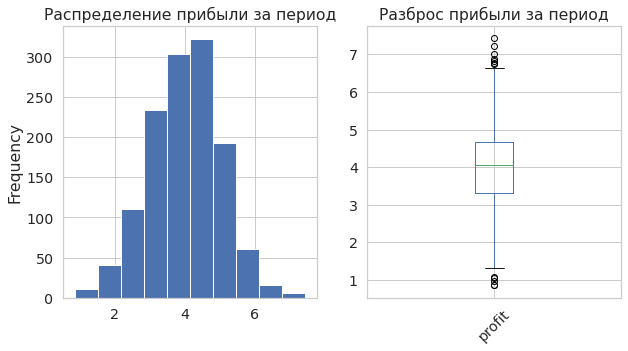

In [41]:
hist_num(data_money['profit'], 'Распределение прибыли за период', 'Разброс прибыли за период')

Данные нормальные, хоть есть и выбросы. По гистограмме можно сказать, что чаще магазин имеет от 3 до 5 прибыли. Меньшие и больше значения - реже, но не превышают 7.5.

Можно приступать к исследованию категориальных показателей. Начнем с информации о покупательской активности:

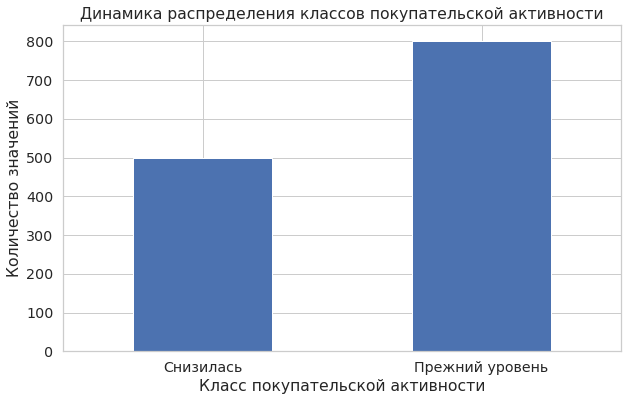

In [42]:
data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0].pivot_table(index='buying_activity', values='id',aggfunc='count').sort_values(by='id').plot(kind='bar', figsize = (10, 6), legend=False)
plt.xlabel("Класс покупательской активности")
plt.ylabel("Количество значений")
plt.title("Динамика распределения классов покупательской активности")
plt.xticks(rotation = 0)
plt.grid(True)

Больше 800 пользователей имеют прежний уровень активности, а у всего 500 пользователей - активность снизилась. 

Изучим столбец с информацией о типе сервиса:

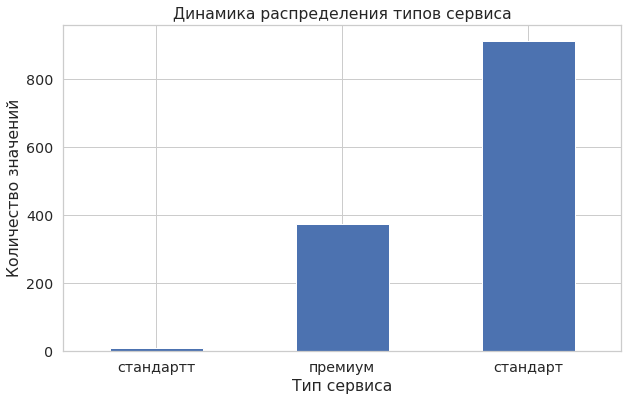

In [43]:
data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0].pivot_table(index='service_type', values='id',aggfunc='count').sort_values(by='id').plot(kind='bar', figsize = (10, 6), legend=False)
plt.xlabel("Тип сервиса")
plt.ylabel("Количество значений")
plt.title("Динамика распределения типов сервиса")
plt.xticks(rotation = 0)
plt.grid(True)

Так, в данных есть неявные дубликаты. Изменим это и снова посмотрим на гистограммы:

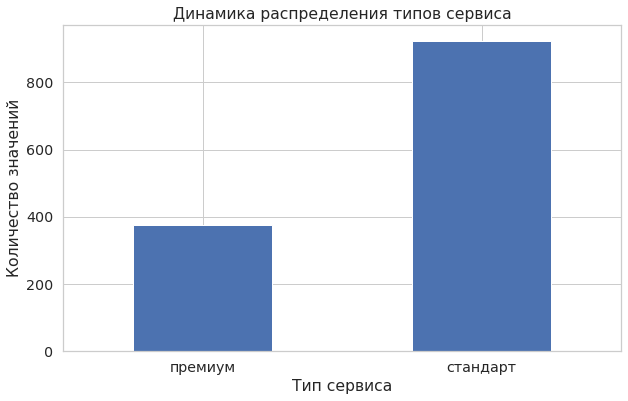

In [44]:
data_market_file.loc[data_market_file['service_type'] == "стандартт", 'service_type'] = "стандарт"
data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0].pivot_table(index='service_type', values='id',aggfunc='count').sort_values(by='id').plot(kind='bar', figsize = (10, 6), legend=False)
plt.xlabel("Тип сервиса")
plt.ylabel("Количество значений")
plt.title("Динамика распределения типов сервиса")
plt.xticks(rotation = 0)
plt.grid(True)

Количество пользователей с типом сервиса стандарт больше чем в 2 раза больше, чем пользователей с премиумом (850 против почти 400).

Следующий показатель для изучения - информация о том, можно ли присылать покупателю дополнительные предложения о товаре:

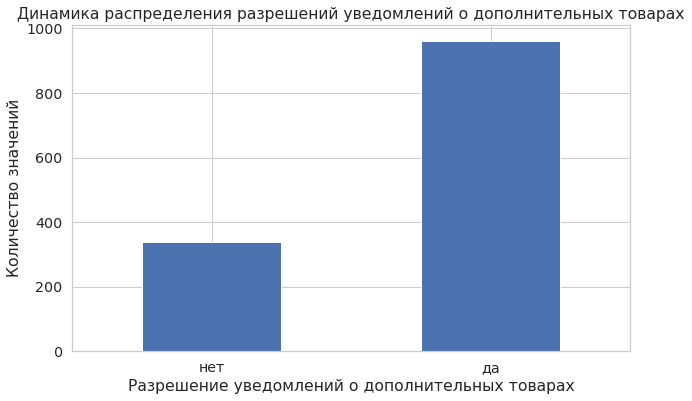

In [45]:
data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0].pivot_table(index='allow_reporting', values='id',aggfunc='count').sort_values(by='id').plot(kind='bar', figsize = (10, 6), legend=False)
plt.xlabel("Разрешение уведомлений о дополнительных товарах")
plt.ylabel("Количество значений")
plt.title("Динамика распределения разрешений уведомлений о дополнительных товарах")
plt.xticks(rotation = 0)
plt.grid(True)

Чаще (в почти 1000 случая их 1300) пользователи соглашаются о информации о дополнительных товарах. Значений "нет" - около 300.

Рассмотрим самую популярную категорию товаров у покупателя за последние 6 месяцев:

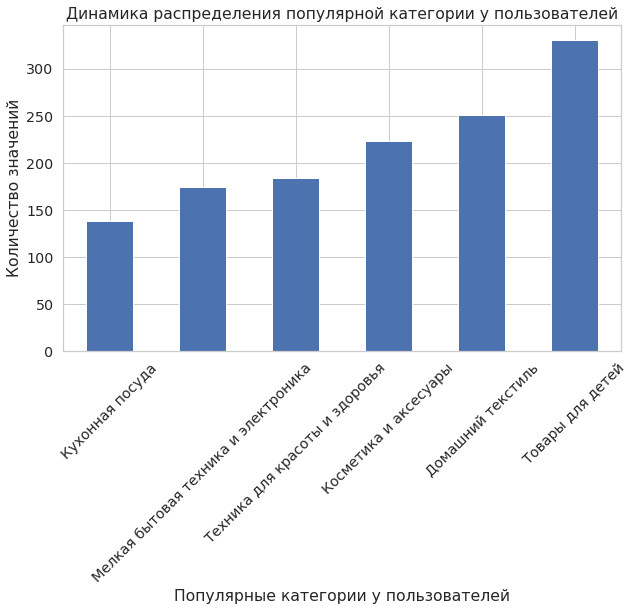

In [46]:
data_market_file.merge(data_money, on='id')[data_market_file.merge(data_money, on='id')['profit']>0].pivot_table(index='popular_category', values='id',aggfunc='count').sort_values(by='id').plot(kind='bar', figsize = (10, 6), legend=False)
plt.xlabel("Популярные категории у пользователей")
plt.ylabel("Количество значений")
plt.title("Динамика распределения популярной категории у пользователей")
plt.xticks(rotation = 45)
plt.grid(True)

Самая пополуярная категория у пользователей - Товары для детей (около 320 значений). За ними идет домашний текстиль (250 значений) и косметика и аксесуары (220 значений).

Следующие показатели для анализа - периоды. Первый период который рассмотрим - период, во время которого зафиксирована выручка:

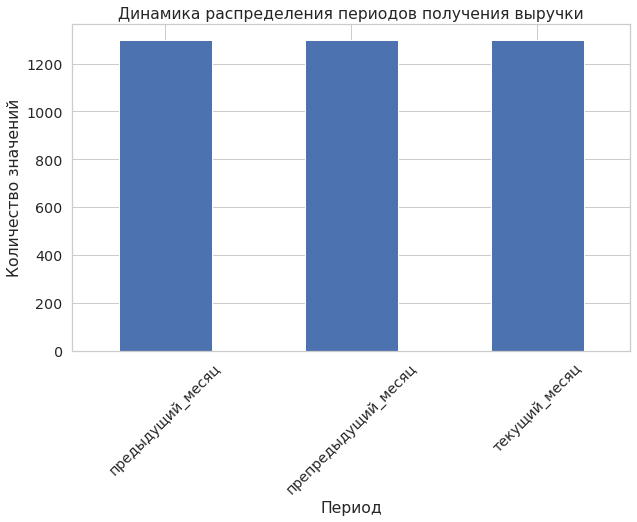

In [47]:
data_market_money.merge(data_money, on='id')[data_market_money.merge(data_money, on='id')['profit']>0].pivot_table(index='period', values='id',aggfunc='count').sort_values(by='id').plot(kind='bar', figsize = (10, 6), legend=False)
plt.xlabel("Период")
plt.ylabel("Количество значений")
plt.title("Динамика распределения периодов получения выручки")
plt.xticks(rotation = 45)
plt.grid(True)

Распределение равномерно распределено между месяцами, значений по 1300 между периодами. Можно смело говорить о том, что это как раз выручки с каждого пользователя в разрезе 3 месяцев.

И, наконец, последним рассмотрим период, во время которого зафиксировано общее время:

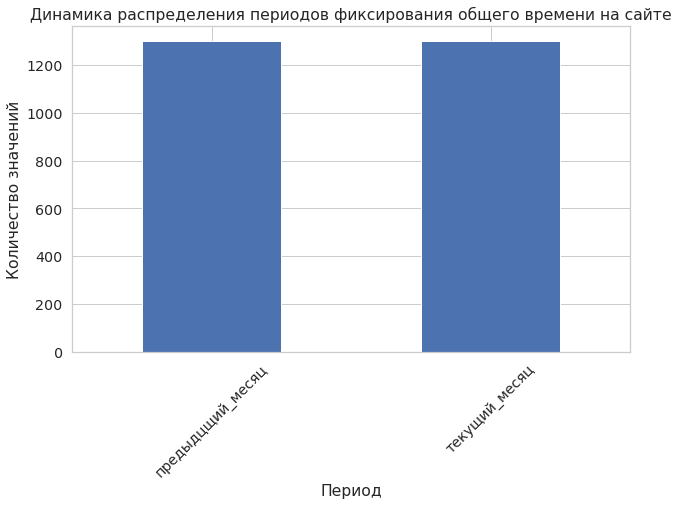

In [48]:
data_market_time.merge(data_money, on='id')[data_market_time.merge(data_money, on='id')['profit']>0].pivot_table(index='period', values='id',aggfunc='count').sort_values(by='id').plot(kind='bar', figsize = (10, 6), legend=False)
plt.xlabel("Период")
plt.ylabel("Количество значений")
plt.title("Динамика распределения периодов фиксирования общего времени на сайте")
plt.xticks(rotation = 45)
plt.grid(True)

Переименуем столбец, исправив ошибку в данных:

In [49]:
data_market_time.loc[data_market_time['period'] == "предыдцщий_месяц", 'period'] = "предыдущий_месяц"

Распределение также равномерно, по 1300, между всеми пользователями. Никаких аномалий. Отлично!

Таким образом, на этапе исследовательского анализа был проведен статистический анализ всех признаков. Было выявлено, что есть аномальные значения в выручке. Мы их устранили когда исследовали гистограммы. 

Все остальные данные как таковых аномальных выбросов не имеют. Было выявлено, что чаще всего значения маркетинговых комуникаций колеблются в пределах от 3 до 5, а чаще всего маркетинговых компаний было 4 - половина данных. Оставшаяся половина равномерно распределена между 3 и 5. Также чаще всего количество дней с момента регистрации на сайте составляет от 400 до 800 дней. Реже 200 или 1000. Чаще всего пользователи просматривали от 2 до 4 категорий. В показателе с информацией о количестве неоплаченных товар есть выбросы с количеством от 8 до 10. По гистограмме видно, что чаще количество неоплаченных товаров составляет от 1 до 5, остальное реже. Среднее количество ошибок сервиса - от 2 до 5, реже остальные. Выбросов нет. Чаще всего пользователи просматривают от 5 до 12 страниц, и очень редко 15 или больше. Среднее значение проведенного времени на сайте в пределах от 10 до 17 минут, значения больше или меньше - реже. В среднем пользователи приносят от 4500 до 5500 рублей. Однако есть и выбросы с большими значенями, но они не привышают 8000 рублей. 

При анализе категориальных показателей было выявлено, что больше 800 пользователей имеют прежний уровень активности, а у всего 500 пользователей - активность снизилась. Количество пользователей с типом сервиса стандарт больше чем в 2 раза больше, чем пользователей с премиумом (850 против почти 400). Чаще (в почти 1000 случая их 1300) пользователи соглашаются о информации о дополнительных товарах. Значений "нет" - около 300. Самая пополуярная категория у пользователей - Товары для детей (около 320 значений). За ними идет домашний текстиль (250 значений) и косметика и аксесуары (220 значений). Распределение равномерно распределено между месяцами, значений по 1300 между периодами. Можно смело говорить о том, что это как раз выручки с каждого пользователя в разрезе 3 месяцев.

Отлично, можно приступать к объединению таблиц.


## Объединение таблиц

In [50]:
data = data_market_file.merge(data_market_money[data_market_money['period']=='текущий_месяц'], on='id', how='left').drop('period', axis=1)
data.rename(columns = {'revenue' :'1_month'}, inplace = True )
data = data.merge(data_market_money[data_market_money['period']=='предыдущий_месяц'], on='id', how='left').drop('period', axis=1)
data.rename(columns = {'revenue' :'2_month'}, inplace = True )
data = data.merge(data_market_money[data_market_money['period']=='препредыдущий_месяц'], on='id', how='left').drop('period', axis=1)
data.rename(columns = {'revenue' :'3_month'}, inplace = True )
data.head()

,id,buying_activity,service_type,allow_reporting,market_active_6_months,market_active_current_month,duration,promotional_purchases,popular_category,average_category_view_visit,unpaid_products_items_q,service_error,pages_per_visit,1_month,2_month,3_month
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5,3293.1,NaN,NaN
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,4971.6,5216.0,4472.0
2,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,5058.4,5457.5,4826.0
3,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,6610.4,6158.0,4793.0
4,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,5872.5,5807.5,4594.0


In [51]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1300 entries, 0 to 1299
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           1300 non-null   int64  
 1   buying_activity              1300 non-null   object 
 2   service_type                 1300 non-null   object 
 3   allow_reporting              1300 non-null   object 
 4   market_active_6_months       1300 non-null   float64
 5   market_active_current_month  1300 non-null   int64  
 6   duration                     1300 non-null   int64  
 7   promotional_purchases        1300 non-null   float64
 8   popular_category             1300 non-null   object 
 9   average_category_view_visit  1300 non-null   int64  
 10  unpaid_products_items_q      1300 non-null   int64  
 11  service_error                1300 non-null   int64  
 12  pages_per_visit              1300 non-null   int64  
 13  1_month           

Отлично, первые 2 датасета объеденены. Добавим к данным третий:

In [52]:
data = data.merge(data_market_time[data_market_time['period']=='текущий_месяц'], on='id', how='left').drop('period', axis=1)
data.rename(columns = {'minutes' :'1_month_time'}, inplace = True )
data = data.merge(data_market_time[data_market_time['period']=='предыдущий_месяц'], on='id', how='left').drop('period', axis=1)
data.rename(columns = {'minutes' :'2_month_time'}, inplace = True )
data.head()

,id,buying_activity,service_type,allow_reporting,market_active_6_months,market_active_current_month,duration,promotional_purchases,popular_category,average_category_view_visit,unpaid_products_items_q,service_error,pages_per_visit,1_month,2_month,3_month,1_month_time,2_month_time
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5,3293.1,NaN,NaN,14,13
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,4971.6,5216.0,4472.0,10,12
2,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,5058.4,5457.5,4826.0,13,8
3,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,6610.4,6158.0,4793.0,13,11
4,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,5872.5,5807.5,4594.0,11,8


In [53]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1300 entries, 0 to 1299
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           1300 non-null   int64  
 1   buying_activity              1300 non-null   object 
 2   service_type                 1300 non-null   object 
 3   allow_reporting              1300 non-null   object 
 4   market_active_6_months       1300 non-null   float64
 5   market_active_current_month  1300 non-null   int64  
 6   duration                     1300 non-null   int64  
 7   promotional_purchases        1300 non-null   float64
 8   popular_category             1300 non-null   object 
 9   average_category_view_visit  1300 non-null   int64  
 10  unpaid_products_items_q      1300 non-null   int64  
 11  service_error                1300 non-null   int64  
 12  pages_per_visit              1300 non-null   int64  
 13  1_month           

Прекрасно, данные загружены. В части колонок есть пропуски - это из-за того, что мы удалили аномалии. Мы заполним эти пропуски на этапе обучения моделей. 

Можем приступать к корреляционному анализу, но перед этим заполним медианным значением строки (в зависимости от покупательской активности), где есть незаполненные количественные значения:

In [54]:
for t in data['buying_activity'].unique():
    data.loc[(data['buying_activity'] == t) & (data['1_month'].isna()), '1_month'] = \
    data.loc[(data['buying_activity'] == t), '1_month'].median()

In [55]:
for t in data['buying_activity'].unique():
    data.loc[(data['buying_activity'] == t) & (data['2_month'].isna()), '2_month'] = \
    data.loc[(data['buying_activity'] == t), '2_month'].median()

In [56]:
for t in data['buying_activity'].unique():
    data.loc[(data['buying_activity'] == t) & (data['3_month'].isna()), '3_month'] = \
    data.loc[(data['buying_activity'] == t), '3_month'].median()

Проверим оставшиеся пропуски:

In [57]:
data.isna().sum()

id                             0
buying_activity                0
service_type                   0
allow_reporting                0
market_active_6_months         0
market_active_current_month    0
duration                       0
promotional_purchases          0
popular_category               0
average_category_view_visit    0
unpaid_products_items_q        0
service_error                  0
pages_per_visit                0
1_month                        0
2_month                        0
3_month                        0
1_month_time                   0
2_month_time                   0
dtype: int64

## Корреляционный анализ

Корреляционный анализ мы начнем с построения тепловой карты по датасетам. Начнем с того, что уберем поле id:

In [58]:
data_without = data.drop('id', axis=1)
data_without = data[['market_active_6_months', 'market_active_current_month', 'duration', 'promotional_purchases', 'average_category_view_visit', 'unpaid_products_items_q', 'service_error', 'pages_per_visit', '1_month', '2_month', '3_month', '1_month_time', '2_month_time']]

Т.к. не все наши количественные признаки распределены равномерно и не все гистограммы были похожи на "купол", используем не кореляцию Пирсона, а корреляцию Спирмена:

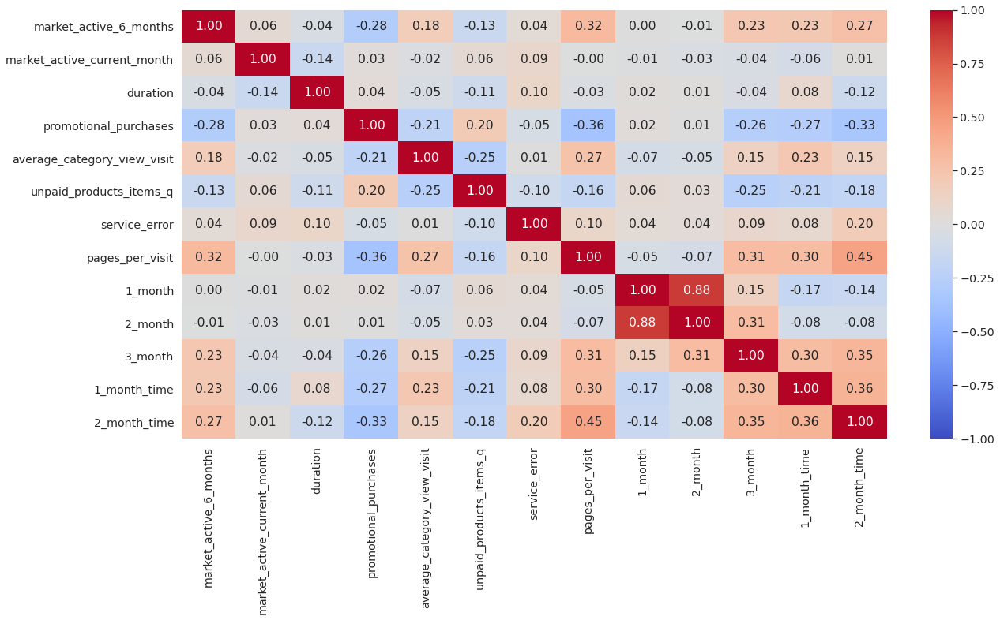

In [59]:
phik_matrix()

Сильная корреляция заметна только между 1 месяцем выручки и 2 месяцем выручки, коэфциент составляет 0.88. Можно предположить, что это происходит из-за сильной активности пользователей в последние 2 месяца и их активности. Т.к. коэфициент не выше 0.9 не станем утвержадть что это мультиколинераность. 

Также есть корреляция между 6 месячной активностью и количеством посещенных страниц (0.32), между количеством страниц и 3 месяцем выручки (0.31), между количеством страниц и 2ым месяцем проведенного времени (0.45).

Отрицательная корреляции наблюдается между количеством страниц и акционными покупками (0.36), а также акционными покупками и 2 месяцем проведенного времени (0.33).

Можно приступать к созданию пайплайнов для применения всех известных моделей.

## Использование пайплайнов

Перед обучением модели создадим функцию, которая переведет целевой признак в количественный вид:

In [60]:
def categorize_activity(data_row):
    activity = data_row['buying_activity']
    try:
        if activity=='Прежний уровень':
            return 0
        else:
            return 1
    except:
        return 1

In [61]:
data['buying_activity_bi'] = data.apply(categorize_activity, axis = 1)
data = data.drop(['buying_activity'], axis=1)

Начнем с разделения выборки на части. Датасет объединен, осталось разделить данные на тренировочную и тестовые выборки:

In [62]:
RANDOM_STATE = 42
TEST_SIZE = 0.25
X_train, X_test, y_train, y_test = train_test_split(
    data.drop(['buying_activity_bi', 'market_active_current_month', 'id'], axis=1),
    data['buying_activity_bi'],
    test_size = TEST_SIZE, 
    random_state = RANDOM_STATE,
    stratify = data['buying_activity_bi'])

X_train.shape, X_test.shape


((975, 15), (325, 15))

Выделим категориальные и количественные столбцы для дальнейшей обработки, создав списки с названиями признаков:

In [63]:
ord_columns = ['service_type', 'allow_reporting']
ohe_columns = ['popular_category']
num_columns = ['market_active_6_months', 'duration', 'promotional_purchases', 'average_category_view_visit', 'unpaid_products_items_q', 'service_error', 'pages_per_visit', '1_month', '2_month', '3_month', '1_month_time', '2_month_time']

Создадим пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование:

In [64]:
ohe_pipe = Pipeline(
    [('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ohe', OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'))
    ]
    )

Создадим пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование:

In [65]:
ord_pipe = Pipeline(
    [('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
     ('ord',  OrdinalEncoder(
                categories=[
                    ['стандарт', 'премиум'], ['нет', 'да'],
                ], 
                handle_unknown='use_encoded_value', unknown_value=np.nan
            )
        ),
     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

Создадим общий пайплайн для подготовки данных:

In [66]:
data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('ord', ord_pipe, ord_columns),
     ('num', MinMaxScaler(), num_columns)
    ], 
    remainder='passthrough'
)

Создадим итоговый пайплайн: подготовка данных и модель:

In [67]:
pipe_final = Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', DecisionTreeClassifier(random_state=RANDOM_STATE))
])

Запишем параметры для перебора параметров для каждой из моделей:

In [68]:
param_grid = [
    # словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2, 6),
        'models__max_features': range(2, 6),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']  
    },
    
    
    # словарь для модели KNeighborsClassifier() 
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(2, 6),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']   
    },

    # словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(
            random_state=RANDOM_STATE, 
            solver='liblinear', 
            penalty='l1'
        )],
        'models__C': range(1, 6),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']  
    },
    # словарь для модели SVC()
    {
        'models': [SVC(
            random_state=RANDOM_STATE,
            probability=True
        )],
        'models__C': range(1, 6),
        'models__kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), RobustScaler(), 'passthrough']   
    }
]


<div class="alert alert-info">
В качестве способа автоматизированного поиска гиперпараметров будет использовать GridSearchCV, чтобы гарантированно все значения. В качестве метрики будем использовать ROC-AUC, так как она является одной из наиболее информативных метрик в задачах классификации, особенно при работе с несбалансированными классами. При этом она обладает рядом преимуществ необходимых для нашей Бизнес-задачи, а именно:

- Качество ранжирования: ROC-AUC оценивает качество ранжирования объектов по их вероятностям принадлежности к классам, что особенно важно в задачах, где важно правильно отранжировать объекты по степени риска.

- Интерпретируемость: ROC-AUC оценивает способность модели отличать между классами, что делает ее интерпретируемой и понятной для бизнеса.

- Независимость от порога: ROC-AUC не зависит от выбора порога классификации и дает обобщенную характеристику качества модели при различных порогах.</div>

In [69]:
grid_search = GridSearchCV(
    pipe_final, 
    param_grid=param_grid, 
    cv=5,
    scoring='roc_auc',
    n_jobs=-1
)

Пропустим наши модели через обучение:

In [70]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         Pipeline(steps=[('simpleImputer_ohe',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ohe',
                                                                                          OneHotEncoder(drop='first',
                                                                                                        handle_unknown='ignore',
                                                                                                        sparse_output=False))]),
                                                                         ['popular_category']),
                                                                        ('ord',
                                                                         Pipeline(steps=[('simpleImputer_before...
                                                        solver='liblinear')],
                          'models__C': range(1, 5),
                          'preprocessor__num': [StandardScaler(),
                                                MinMaxScaler(), RobustScaler(),
                                                'passthrough']},
                         {'models': [SVC(probability=True, random_state=42)],
                          'models__C': range(1, 5),
                          'models__kernel': ['linear', 'rbf', 'poly',
                                             'sigmoid'],
                          'preprocessor__num': [StandardScaler(),
                                                MinMaxScaler(), RobustScaler(),
                                                'passthrough']}],
             scoring='roc_auc')

Выведем лучшие результаты и параметры:

In [71]:
print('Лучшая модель и её параметры:\n\n', grid_search.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', grid_search.best_score_)
print('Параметры лучшей модели:', grid_search.best_params_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['popular_category']),
                                                 ('ord',
                                                  Pipeline(steps=[('simpleImputer_before_ord',
               

Проверим работу модели на тестовой выборке и рассчитаем прогноз на тестовых данных:

In [73]:
y_test_pred = grid_search.predict(X_test)
y_test_proba = grid_search.predict_proba(X_test)[:, 1]
print(f'Метрика ROC-AUC на тестовой выборке: {roc_auc_score(y_test, y_test_proba)}')

Метрика ROC-AUC на тестовой выборке: 0.9105681271064034


Выведем все результаты и отсортируем по рейтингу качества моделей:

In [73]:
result = pd.DataFrame(grid_search.cv_results_)
result[
    ['rank_test_score', 'param_models', 'mean_test_score','params']
].sort_values('rank_test_score')

,rank_test_score,param_models,mean_test_score,params
68,1,"SVC(probability=True, random_state=42)",0.920861,"{'models': SVC(probability=True, random_state=..."
70,2,"SVC(probability=True, random_state=42)",0.920406,"{'models': SVC(probability=True, random_state=..."
86,3,"SVC(probability=True, random_state=42)",0.918024,"{'models': SVC(probability=True, random_state=..."
84,4,"SVC(probability=True, random_state=42)",0.917699,"{'models': SVC(probability=True, random_state=..."
102,5,"SVC(probability=True, random_state=42)",0.916066,"{'models': SVC(probability=True, random_state=..."
...,...,...,...,...
77,124,"SVC(probability=True, random_state=42)",0.546772,"{'models': SVC(probability=True, random_state=..."
79,125,"SVC(probability=True, random_state=42)",0.514310,"{'models': SVC(probability=True, random_state=..."
95,126,"SVC(probability=True, random_state=42)",0.502732,"{'models': SVC(probability=True, random_state=..."
111,127,"SVC(probability=True, random_state=42)",0.494298,"{'models': SVC(probability=True, random_state=..."


Таким образом, лучшая модель это модель SVC с коэфициентом C - 1. Метрика ROC-AUC на тестовых данных составляет целых 0.921. На тестовой выборке результат - 0.8635.

## Анализ важности признаков

Для начала обучим модель по нашему лучшему решению. Сначала подготовим данные:

In [81]:
ohe = OneHotEncoder(
        drop='first',  # Удаление первого уровня каждой категориальной переменной для избежания мультиколлинеарности
        sparse_output=False,  # Вывод данных в виде плотной матрицы
        handle_unknown='ignore'  # Игнорирование неизвестных категорий в тестовых данных
    )    
    # Преобразование категориальных переменных в тренировочном наборе
X_train_ohe = ohe.fit_transform(X_train[ohe_columns])
    # Преобразование категориальных переменных в тестовом наборе
X_test_ohe = ohe.transform(X_test[ohe_columns])
    # Получение имен признаков после One-Hot кодирования
ohe_encoder_col_names = ohe.get_feature_names_out() 
    # Преобразование массивов в DataFrame
X_train_ohe = pd.DataFrame(X_train_ohe, columns=ohe_encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=ohe_encoder_col_names)

    # Инициализация Ordinal Encoder'а для порядковых переменных
ord_encoder = OrdinalEncoder(
    handle_unknown='use_encoded_value', 
    unknown_value=np.nan  # Обработка неизвестных категорий путем присвоения NaN
    )
    # Кодирование порядковых переменных
X_train_ord = ord_encoder.fit_transform(X_train[ord_columns])
X_test_ord = ord_encoder.transform(X_test[ord_columns])
    # Получение имен признаков после порядкового кодирования (в текущей версии pandas/OrdinalEncoder это может быть недоступно)
ord_encoder_col_names = ord_encoder.get_feature_names_out()    
    # Преобразование массивов в DataFrame
X_train_ord = pd.DataFrame(X_train_ord, columns=ord_encoder_col_names)
X_test_ord = pd.DataFrame(X_test_ord, columns=ord_encoder_col_names)
    # Инициализация RobustScaler для масштабирования числовых переменных
scaler = StandardScaler()  
    # Масштабирование числовых переменных
X_train_scaled = scaler.fit_transform(X_train[num_columns])
X_test_scaled = scaler.transform(X_test[num_columns])    
    # Преобразование массивов в DataFrame
X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_columns)    

# Объединение обработанных данных в один DataFrame
X_train_best = pd.concat([X_train_ohe, X_train_ord, X_train_scaled], axis=1)
X_test_best = pd.concat([X_test_ohe, X_test_ord, X_test_scaled], axis=1)




In [74]:
clf_best = grid_search.best_estimator_.named_steps['models']  
clf_best 

SVC(C=1, probability=True, random_state=42)

In [88]:


print(grid_search.best_estimator_.named_steps['preprocessor'].get_feature_names_out())

grid_search.best_estimator_.named_steps['models'] 

['ohe__popular_category_Косметика и аксесуары'
 'ohe__popular_category_Кухонная посуда'
 'ohe__popular_category_Мелкая бытовая техника и электроника'
 'ohe__popular_category_Техника для красоты и здоровья'
 'ohe__popular_category_Товары для детей' 'ord__service_type'
 'ord__allow_reporting' 'num__market_active_6_months' 'num__duration'
 'num__promotional_purchases' 'num__average_category_view_visit'
 'num__unpaid_products_items_q' 'num__service_error'
 'num__pages_per_visit' 'num__1_month' 'num__2_month' 'num__3_month'
 'num__1_month_time' 'num__2_month_time']


SVC(C=1, probability=True, random_state=42)

Предскажем метки классов и вероятность принадлежности к положительному классу:

In [153]:
y_pred = clf_best.predict(X_test_best.values)
y_proba = clf_best.predict_proba(X_test_best.values)[:, 1]

Выведем метрики нашей лучшей модели:

In [154]:
print('Метрики лучшей модели:')
roc_auc = cross_val_score(clf_best, X_train_best, y_train, scoring='roc_auc').mean()  
print(f'ROC-AUC на тренировочной выборке: {round(roc_auc, 3)}') 
print(f'ROC-AUC на тестовой выборке: {round(roc_auc_score(y_test, y_pred), 3)}')
acc = accuracy_score(y_test, y_pred)  
print('Accuracy:', round(acc, 3))
f1 = f1_score(y_test, y_pred, pos_label=1)  
print('F1-score:', round(f1, 3))

Метрики лучшей модели:
ROC-AUC на тренировочной выборке: 0.921
ROC-AUC на тестовой выборке: 0.861
Accuracy: 0.889
F1-score: 0.836


Таким образом, в качествелучшей модели была выбрана Support Vector Classifier (SVC) с радиальным базисным функциональным ядром ('rbf') и параметром регуляризации C равным 1. 

Для преобразования категориальных данных был применен метод OneHotEncoder, для порядковых количественных - OrdinalEncoder и, наконец, для количественных StandardScaler.

ROC-AUC на тренировочной выборке составил 0.921, что готоворит, о том, что модель высокого качества. На тестовой выборке ROC-AUC составил 0.861, что говорит о том, что модель сохранила свои предсказательные способности на новых данных.

Accuracy составило 0.889, что также говорит о высокой способности модели корректно классифицировать наблюдения.

F1-мера составила 0.836, что говорит о отличном балансе между точностью и полнотой модели.


Исходя из вышесказанного, итоговая модель SVC с оптимальными гиперпараметрами и предварительной обработкой данных показала высокое качество предсказаний, как на тренировочной, так и на тестовой выборках. Выбранные методы предобработки данных в сочетании с методом SVC обеспечили устойчивость к влиянию выбросов. Это подтверждается сопоставимыми показателями ROC-AUC на тренировочной и тестовой выборках, а также высокими значениями точности и F1-меры. Таким образом, можно утверждать, что SVC с выбранными параметрами является надежной моделью для решения задачи классификации по представленным данным.

# Построение матрицы ошибок #

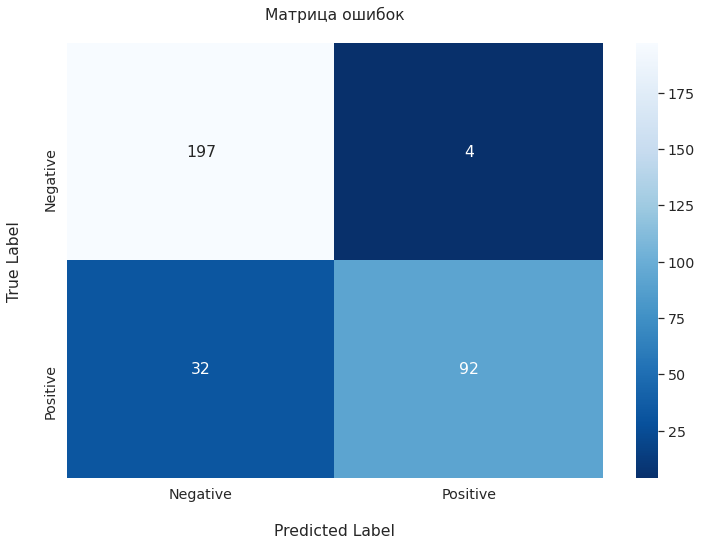

In [105]:
cm = confusion_matrix(y_test, y_pred)

# Визуализация
plt.figure(figsize=(12, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('\nPredicted Label')
plt.ylabel('True Label\n')
plt.title('Матрица ошибок\n');

В нашем случае нужно предсказывать положительный класс, т.е. определить, что все клиенты, которые снизили активности модель предсказывала верно. Соотвественно, нам нужно снизить ошибку второго рода.

При помощи метода classification_report выведем отчет о классификации:

In [104]:
pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose()

,precision,recall,f1-score,support
0,0.860262,0.980100,0.916279,201.000000
1,0.958333,0.741935,0.836364,124.000000
accuracy,0.889231,0.889231,0.889231,0.889231
macro avg,0.909298,0.861017,0.876321,325.000000
weighted avg,0.897680,0.889231,0.885788,325.000000


Матрица ошибок отражает, как модель классифицирует образцы в тестовой выборке:

1) Истинно отрицательные - 197
2) Ложно положительные - 4
3) Ложно отрицательные - 32
4) Истинно положительные - 92

Исходя из получившихся результатов, можно сказать, что что модель имеет хорошую способность к правильному определению результата. У модели незначительное количество ложно отрицательных результатов, что говорит, что модель хорошо справляется определнием итога.

По классификационному отчету можно заключить, что для отрицательного класса точность (Precision) составляет 0.86, что свидетельствует о том, что модель редко ошибается, когда прогнозирует отрицательный класс. Для положительного класса точность выше - 0.968. Полнота (Recall) для положительного класса выше, чем для отрицательного (0.985 против 0.742), что говорит о том, что модель лучше обнаруживает положительные случаи. F1-мера для положительного класса - 0.84, это сбалансированная мера точности и полноты, и её значение говорит о достаточно хорошем качестве модели. Общая точность (Accuracy) - 0.892, что довольно высоко и указывает на общую эффективность модели в классификации.

Для нас важнейшим показателем будет являться recall. От нас требуется высокое значение recall для минимизации количества упущенных клиентов с пониженной активностью, даже если это приведет к незначительному повышению ложноположительных результатов.

Таким образом, модель имеет высокую производительность с высокой точностью, специфичностью и достаточной полнотой. Однако, несмотря на высокие общие показатели и точности, существует возможность для дальнейшего улучшения полноты, особенно для положительного класса, чтоб уменьшить количество ложно отрицательных результатов. Это могло бы улучшить модель и подготовить её для применения на реальных данных.

Опционально, отрисуем гиперплоскости лучший модели и изучим получившиеся графики. Для начала напишем функция, для того, чтоб, далее в цикле, отстроить наши гиперплоскости.

In [92]:
def plot_training_data(kernel, Х_values, y_values):
    X = Х_values
    y = y_values
    # Инициализируем SVM с указанным ядром и обучение модели
    clf = SVC(kernel=kernel, C=1, probability=True, random_state=RANDOM_STATE).fit(X, y)
    
    # Создаем фигуры и осей для графика
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Определяем границ графика
    x_min, x_max, y_min, y_max = -3, 3, -3, 3
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    
    # Параметры, общие для всех методов построения границы принятия решений
    common_params = {"estimator": clf, "X": X, "ax": ax}
    
    # Отображаем границы принятия решений в виде заливки (pcolormesh)
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="predict",
        plot_method="pcolormesh",
        alpha=0.3,
        shading='auto',
        cmap='coolwarm' # Цветовая схема для области решений
    )
    
    # Отображаем границы принятия решений в виде контура (contour)
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="decision_function",
        plot_method="contour",
        levels=[-1, 0, 1],
        colors=["blue", "red", "green"], # Цвета для линий уровней
        linestyles=["--", "-", "--"], # Стили линий для уровней
    )
    
    # Отображаем опорных векторов
    ax.scatter(
        clf.support_vectors_[:, 0],
        clf.support_vectors_[:, 1],
        s=100,
        facecolors="none",
        edgecolors="purple", # Цвет границы опорных векторов
        label="Support Vectors" # Подпись для опорных векторов
    )
    
    # Отображаем образцов (samples) с использованием цветовой карты viridis
    scatter = ax.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', s=50, edgecolors="w", label="Samples")
    # 'w' для белых границ точек
    
    # Добавляем легенды на график
    legend = ax.legend(*scatter.legend_elements(), loc="upper right", title="Classes")
    ax.add_artist(legend)
    
    # Добавляем метки к осям и заголовка графика
    ax.set_xlabel(X_0)
    ax.set_ylabel(X_1)
    ax.set_title(f"Границы принятия решений с ядром {kernel} модели SVC")
    
    plt.show()

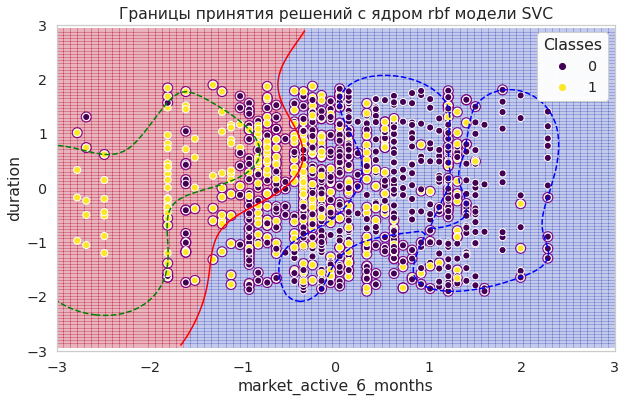

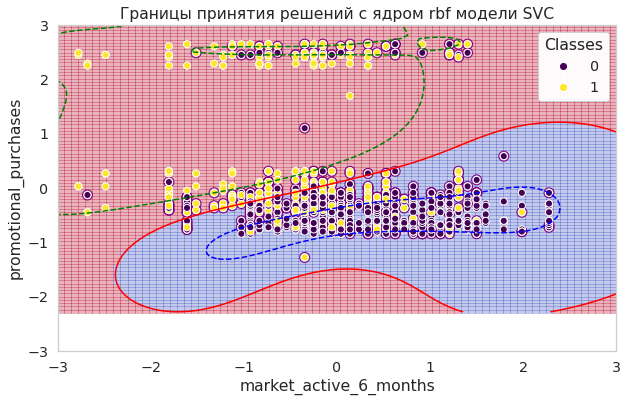

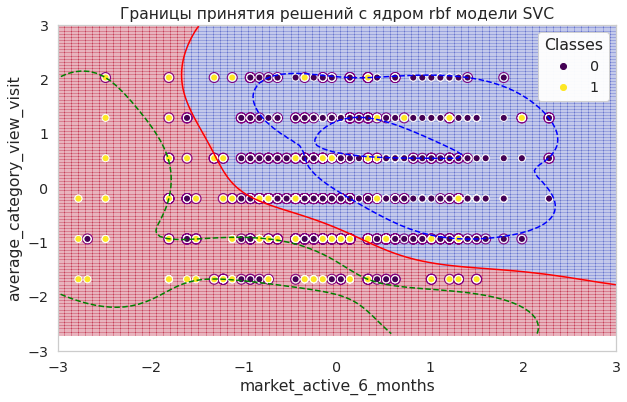

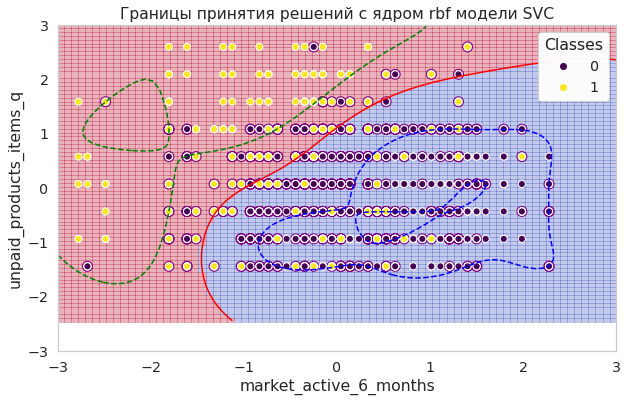

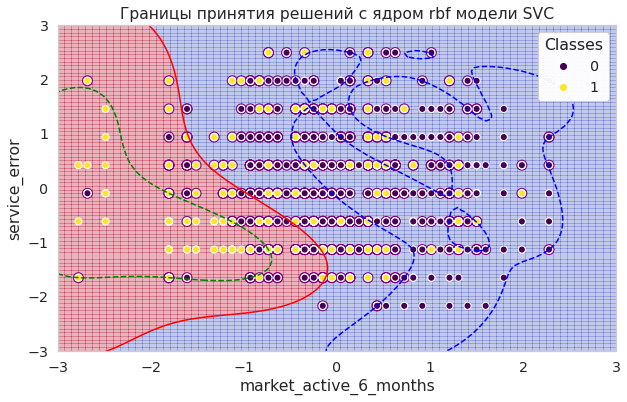

...

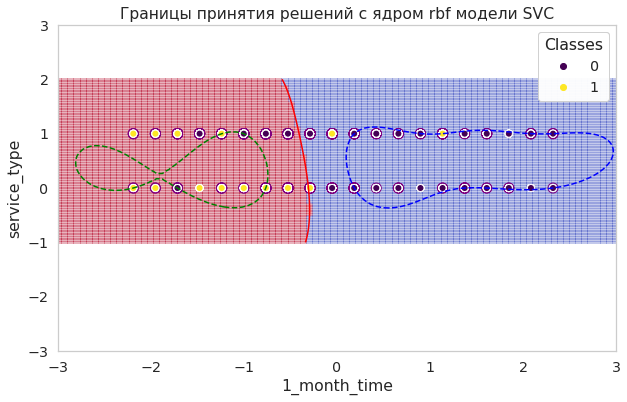

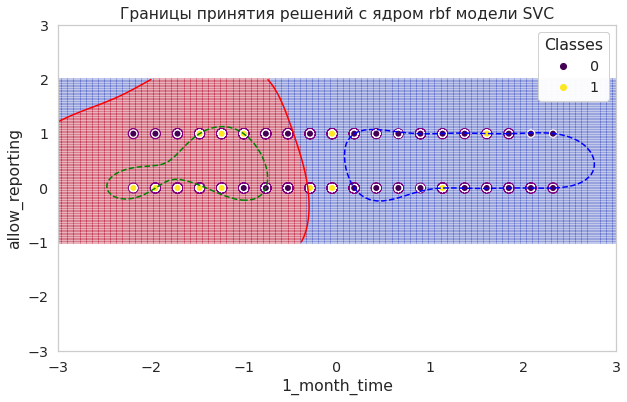

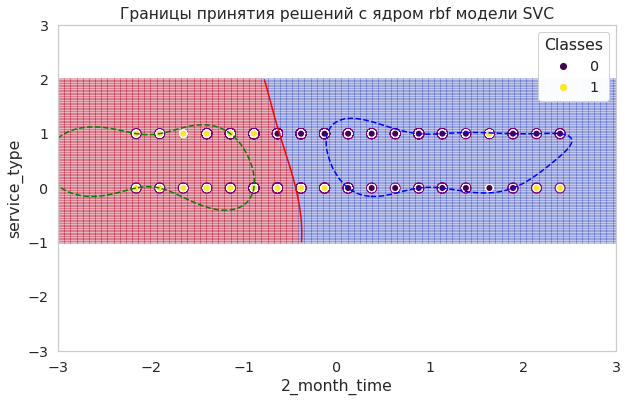

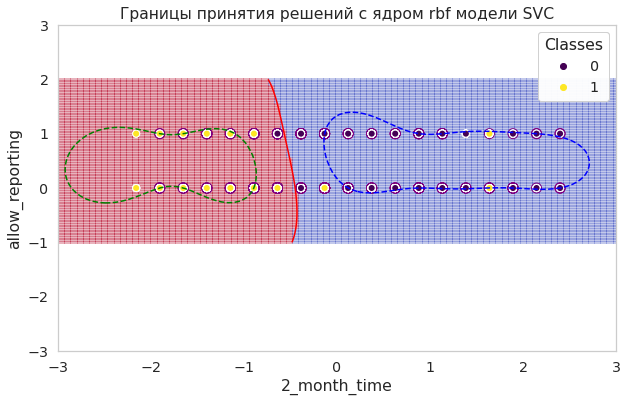

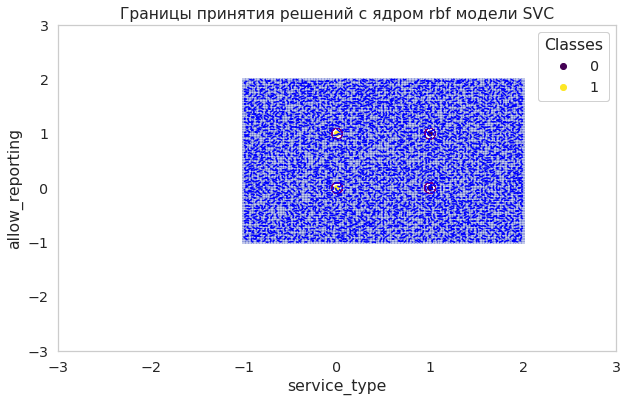

In [93]:
X_train_columns = X_train_best[num_columns + ord_columns]
for i in range(len(X_train_columns.columns) - 1):
    for j in range(i + 1, len(X_train_columns.columns)):
        X_0 = X_train_columns.columns[i]
        X_1 = X_train_columns.columns[j]    
        plot_training_data("rbf", X_train_columns[[X_0, X_1]].values, y_train.values)

Легенда:

Класс 0: темно-фиолетовые точки

Класс 1: желтые точки

Границы и области решений:

Область решений показаны красным и синим цветом, указывающие области, где модель предсказывает каждый класс.

Красная сетчатая область указывает на область решения для одного класса, в то время как синяя сетчатая область указывает на область решения для другого класса.

Имеются три контурные линии: пунктирная зеленая, сплошная синяя и пунктирная синяя линии. Эти линии представляют границы и границу решения SVC.

Опорные векторы обозначены большими кругами с белой окантовкой вокруг меньших точек данных, подчеркивающими критические элементы, которые SVC использует для создания границы решения.

В целом, для большинства параметров, границы выглядят достаточно оптимально. Иногда встречаются гиперплоскости, где нельзя определеить границу или, возможно, произошло переобучение.

# Определение важности методом SHAP

Построим график важности для лучшей модели:

  0%|          | 0/325 [00:00<?, ?it/s]

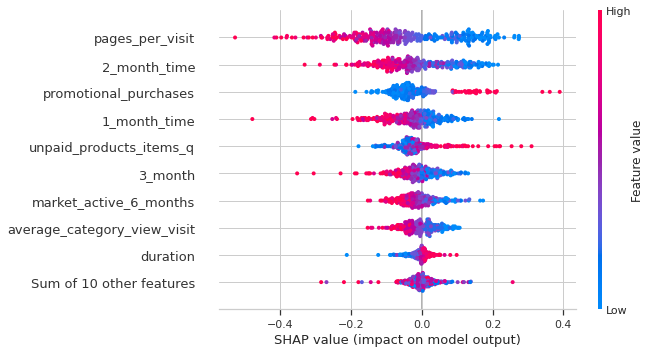

In [94]:
# Инициализируем KernelExplainer с суммарным фоном
background_summary_best = shap.sample(X_train_best, nsamples=NSAMPLES, random_state=RANDOM_STATE)
explainer_best_predict = shap.KernelExplainer(clf_best.predict, background_summary_best)

# Вычисляем SHAP значения
shap_values_best_predict = explainer_best_predict(X_test_best)

# Визуализируем SHAP значений с помощью графика beeswarm
shap.plots.beeswarm(shap_values_best_predict)

<div class="alert alert-info">
Построим также график общей значимости признаков: </div>

In [144]:
explainer = shap.KernelExplainer(clf_best.predict, background_summary_best)
shap_values = explainer.shap_values(background_summary_best)

  0%|          | 0/20 [00:00<?, ?it/s]

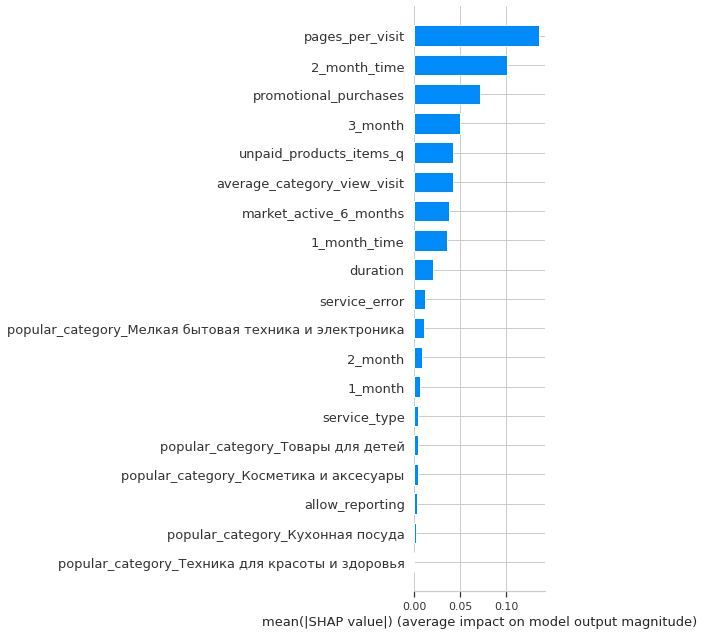

In [147]:
shap.summary_plot(shap_values, X_train_best, plot_type="bar")

Исходя из анализа SHAP-значений и графика SHAP общей значимости признаков, наиболее значимые признаки это - страницы за визит, акционные покупки, время на сайте предыдущий и текущий месяца. Менее значимо виляют длительность, активность за 6 месяцев, средний просмотр категорий за визит.

Наибольшее влияние на модель оказывают "Страницы_за_визит" и "Акционные_покупки". Это означает, что количество просмотренных страниц за визит и покупки по акциям значительно влияют на прогнозируемое поведение пользователя.

Признак "Страниц_за_визит" имеет высокое положительное влияние на модель, что видно по большому количеству красных точек справа. Из этого следует, что большее количество просмотренных страниц во время визита обычно увеличивает предсказание модели в положительную сторону.

Признак "Акционные_покупки" В целом они либо слабо, либо отрицательно влияют на таргет, но при этом необходимо учесть долю таких покупок, так как при высокой доли вероятность снижения активности резко повышается. Следоватьельно целесообразно сегментировать покупателей по высокой доли таких покупок.


Таким образом на этапе анализа важности признаков была обучена лучшая выбранная модель. Модель SVC с RBF-ядром была успешно обучена, достигнув высоких показателей качества на тренировочной и тестовой выборках.

При построении матрицы ошибок было выявлено, что модель имеет хорошую способность к правильному определению результата. У модели незначительное количество ложно отрицательных результатов, что говорит, что модель хорошо справляется определнием итога.

По классификационному отчету можно заключить, что для отрицательного класса точность (Precision) составляет 0.86, что свидетельствует о том, что модель редко ошибается, когда прогнозирует отрицательный класс. Для положительного класса точность выше - 0.968. Полнота (Recall) для положительного класса выше, чем для отрицательного (0.985 против 0.742), что говорит о том, что модель лучше обнаруживает положительные случаи. F1-мера для положительного класса - 0.84, это сбалансированная мера точности и полноты, и её значение говорит о достаточно хорошем качестве модели. Общая точность (Accuracy) - 0.892, что довольно высоко и указывает на общую эффективность модели в классификации.

Также на данном этапе были отстроены гиперплоскости, границы которых выглядят достатчно оптимально, за исключением некоторых признаков.

И, наконец, была определена важность признаков методом SHAP. Исходя из получившихся результатов, можно сказать, что самыми влияющими на предсказание модели являются признаки: страницы за визит, акционные покупки, время на сайте предыдущий и текущий месяца. Менее значимыми признаками оказались: длительность, активность за 6 месяцев, средний просмотр категорий за визит.

## Сегментация покупателей

Объеденим наш общий датасет с прогнозами лучшей модели:

In [155]:
y_proba_train = clf_best.predict_proba(X_train_best)[:,1]

# Создадим массив, содержащий предсказанные метки классов для каждого объекта из X_train_best.
y_pred_train = clf_best.predict(X_train_best)

# Объединяем выборки
df_train = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)

# Добавление предсказанных вероятностей и классов для обучающего набора данных
df_train['probability'] = y_proba_train.tolist()
df_train['pred_class'] = y_pred_train.tolist()

# Добавление предсказанных вероятностей и классов для тестового набора данных
df_test['probability'] = y_proba.tolist()
df_test['pred_class'] = y_pred.tolist()

# Создадим итоговую таблицу с предсказаниями
data_final = pd.concat([df_train, df_test])
data_final.insert(0, 'id', data['id'])
data_final.head()





/opt/conda/lib/python3.9/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(


,id,service_type,allow_reporting,market_active_6_months,duration,promotional_purchases,popular_category,average_category_view_visit,unpaid_products_items_q,service_error,pages_per_visit,1_month,2_month,3_month,1_month_time,2_month_time,buying_activity_bi,probability,pred_class
187,215535,стандарт,нет,2.6,302,0.31,Товары для детей,2,1,1,7,4667.9,4430.0,4586.0,9,7,1,0.950168,1
819,216167,стандарт,нет,4.4,791,0.24,Кухонная посуда,3,1,4,8,5763.0,5132.5,4555.0,20,12,0,0.041994,0
893,216241,премиум,да,6.1,668,0.17,Домашний текстиль,6,4,4,14,5415.6,5159.5,5014.0,11,10,0,0.028887,0
348,215696,премиум,да,3.4,384,0.98,Кухонная посуда,1,9,4,3,6457.8,5728.5,4779.0,11,16,1,0.942765,1
1069,216417,премиум,да,4.6,485,0.23,Мелкая бытовая техника и электроника,2,5,7,13,4014.0,4163.5,4486.0,11,20,0,0.103189,0


Данные объединены с прогнозами. Можно приступать к сегментации покупателей.

In [156]:
fig = px.scatter(data_final, x='probability', y='promotional_purchases', trendline="ols")
fig.update_layout(title='Взаимосвязь между вероятностью снижения покупательской активности и акционными покупками', xaxis_title='Вероятность', yaxis_title='Акционные покупки') 
fig.show()

Исходя из получившегося графика можно выбрать сегмент:

Покупатели с макс. долей покупок по акции (>0.7) и высокой вероятностью снижения покупательской активности (>0.6):

In [157]:
data_segment = data_final.query('(promotional_purchases > 0.7) & (probability > 0.6)')
data_no_segment = data_final.query('(promotional_purchases < 0.7) & (probability < 0.6)')
data_segment.head()

,id,service_type,allow_reporting,market_active_6_months,duration,promotional_purchases,popular_category,average_category_view_visit,unpaid_products_items_q,service_error,pages_per_visit,1_month,2_month,3_month,1_month_time,2_month_time,buying_activity_bi,probability,pred_class
348,215696,премиум,да,3.4,384,0.98,Кухонная посуда,1,9,4,3,6457.8,5728.5,4779.0,11,16,1,0.942765,1
28,215376,стандарт,да,2.4,534,0.98,Домашний текстиль,4,1,5,4,6209.2,6061.0,4723.0,9,8,1,0.991601,1
579,215927,стандарт,да,5.2,801,0.99,Кухонная посуда,2,1,4,9,4968.9,5108.0,4798.0,9,17,1,0.752897,1
156,215504,стандарт,да,3.4,458,0.90,Товары для детей,2,4,2,2,3412.5,3432.0,4543.0,10,11,1,0.977886,1
173,215521,премиум,нет,1.5,541,0.90,Товары для детей,2,4,4,5,4650.8,4045.0,4265.0,13,11,1,0.982176,1


In [158]:
data_segment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 131 entries, 348 to 217
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           131 non-null    int64  
 1   service_type                 131 non-null    object 
 2   allow_reporting              131 non-null    object 
 3   market_active_6_months       131 non-null    float64
 4   duration                     131 non-null    int64  
 5   promotional_purchases        131 non-null    float64
 6   popular_category             131 non-null    object 
 7   average_category_view_visit  131 non-null    int64  
 8   unpaid_products_items_q      131 non-null    int64  
 9   service_error                131 non-null    int64  
 10  pages_per_visit              131 non-null    int64  
 11  1_month                      131 non-null    float64
 12  2_month                      131 non-null    float64
 13  3_month           

Таким образом, было отобрано 131 клиентов.

Исследуем выбранную группу покупателей:

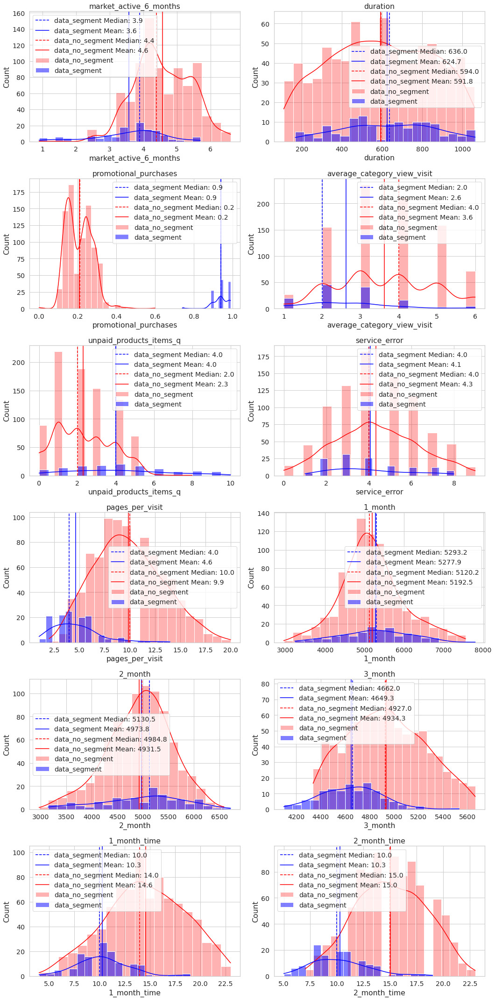

In [159]:
# Создадим графика с 6 подграфиками в два столбца
fig, axes = plt.subplots(6, 2, figsize=(15, 30))

# Преобразуем 2D массива подграфиков в 1D для удобного индексирования
axes = axes.ravel()

# Построим гистограммы с ядерной оценкой плотности для каждого столбца
for i, column in enumerate(num_columns):
    # Построим гистограммы для второго датафрейма
    sns.histplot(data=data_no_segment[column], bins=20, kde=True, color='red', alpha=0.3, label='data_no_segment', ax=axes[i])
    # Построим гистограммы для первого датафрейма
    sns.histplot(data=data_segment[column], bins=20, kde=True, color='blue', label='data_segment', ax=axes[i])
    axes[i].set_title(column)
    
    # Добавим медианы и среднего значения для первого датафрейма
    median_segment = data_segment[column].median()
    mean_segment = data_segment[column].mean()
    axes[i].axvline(median_segment, color='blue', linestyle='--', label=f'data_segment Median: {median_segment:.1f}')
    axes[i].axvline(mean_segment, color='blue', linestyle='-', label=f'data_segment Mean: {mean_segment:.1f}')

    # Добавим медианы и среднего значения для второго датафрейма
    median_no_segment = data_no_segment[column].median()
    mean_no_segment = data_no_segment[column].mean()
    axes[i].axvline(median_no_segment, color='red', linestyle='--', label=f'data_no_segment Median: {median_no_segment:.1f}')
    axes[i].axvline(mean_no_segment, color='red', linestyle='-', label=f'data_no_segment Mean: {mean_no_segment:.1f}')    
    
    axes[i].legend()

# Покажем графики
plt.tight_layout()
plt.show()

По гистограммам можно сделать вывод, что большая часть клиентов из этого сегмента приносят среднестатистическую прибыль в компании, при этом чаще сталкиваются с ошибками на сервисе, имеют достаточно высокое кол-во неоплаченных товаров в корзине и посещают меньше страниц на сайте. Можно сказать, что клиенты уже знают, что хотят купить.

По маркетинговой активности видно отставание данной группы от остальных пользователей. Нужно увеличить маркетинговую активности для этой сегментированной группы. Также, средний просмотр категории за визит тоже ниже, чем выборке без сегмента. Это может говорить о том, что пользователи уже знают, что купить, когда заходят на сайт.

Можно обратить внимание, что количество неоплаченных продуктов в среднем в 2 раза больше, чем у остальных покупателей. Для того, чтоб изучить этот вопрос, следовало бы изучить какие группы продуктов попадают в неоплаченные товары.

Исходя из информации о страницах за визит, также можно говорить о том, что пользователи знают, что купить, поэтому меньше количество страниц посещают.

И, наконец, выручка предпредыдущий и за предыдущий месяц. Разница зависит от периода. Возможно, акции, которые проводились за те периоды, менее интересовали сегметированную группу клиентов.

Для работы с данными проблемами можно предложить разные стратегии:

1) Сфокусировать рекламные усилия на пользователей с низкой маркетинговой активностью, чтобы попытаться повысить их вовлеченность.

2) Персонализировать предложения.

3) Устранение ошибок сервиса и улучшение навигации, чтобы увеличить количество страниц, просмотренных за визит, и длительность пребывания на сайте.

4) Анализ причин возврата.

5) Анализ выручки (изучение динамики выручки за несколько месяцев может помочь понять, какие периоды являются наиболее и наименее прибыльными).

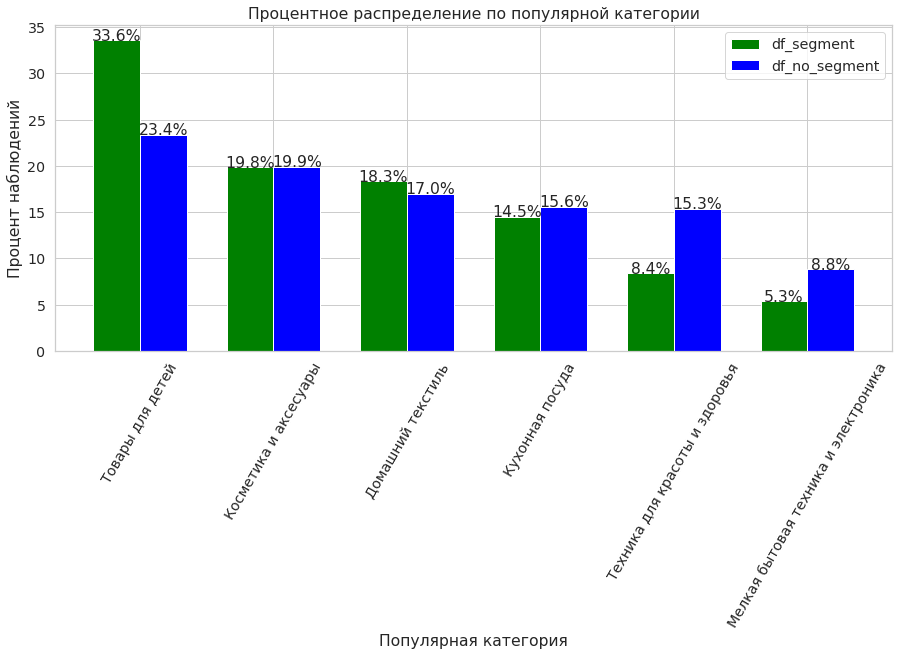

In [160]:
# Подсчет процентного распределения для первого датафрейма (data_segment)
counts_segment = data_segment['popular_category'].value_counts(normalize=True) * 100

# Подсчет процентного распределения для второго датафрейма (data_no_segment)
counts_no_segment = data_no_segment['popular_category'].value_counts(normalize=True) * 100

# Создаем столбчатую диаграмму
plt.figure(figsize=(15, 6))

# Позиции для каждой группы столбцов
x_segment = range(len(counts_segment))
x_no_segment = [x + 0.35 for x in x_segment]

# Построение столбцов для первого датафрейма (df_segment)
plt.bar(x_segment, counts_segment, color='green', width=0.35, label='df_segment')

# Построение столбцов для второго датафрейма (df_no_segment)
plt.bar(x_no_segment, counts_no_segment, color='blue', width=0.35, label='df_no_segment')

# Добавляем текстовые метки к столбцам первого датафрейма
for i in range(len(counts_segment)):
    plt.text(x_segment[i], counts_segment.iloc[i], f"{counts_segment.iloc[i]:.1f}%", ha='center')

# Добавляем текстовые метки к столбцам второго датафрейма
for i in range(len(counts_no_segment)):
    plt.text(x_no_segment[i], counts_no_segment.iloc[i], f"{counts_no_segment.iloc[i]:.1f}%", ha='center')

# Добавляем заголовок и подписи к осям
plt.title('Процентное распределение по популярной категории')
plt.xlabel('Популярная категория')
plt.ylabel('Процент наблюдений')

# Установка меток на оси x
plt.xticks([x + 0.35 / 2 for x in range(len(counts_segment))], counts_segment.index)

# Установка поворота названий категорий на 60 градусов
plt.xticks(rotation=60)

# Добавляем легенду
plt.legend()

plt.show()

In [161]:
# Группировка по категориям и расчет средних значений разницы выручки для каждой категории
data_diff_by_category = data_segment.groupby('popular_category').agg({
    '3_month': 'mean',
    '2_month': 'mean',
    '1_month': 'mean',
}).reset_index()

data_diff_by_category

,popular_category,3_month,2_month,1_month
0,Домашний текстиль,4662.458333,5076.270833,5385.887500
1,Косметика и аксесуары,4672.576923,5258.057692,5599.957692
2,Кухонная посуда,4671.000000,5457.447368,5861.405263
3,Мелкая бытовая техника и электроника,4889.857143,5260.357143,5573.100000
4,Техника для красоты и здоровья,4603.454545,4400.909091,4747.900000
5,Товары для детей,4592.204545,4638.852273,4862.186364


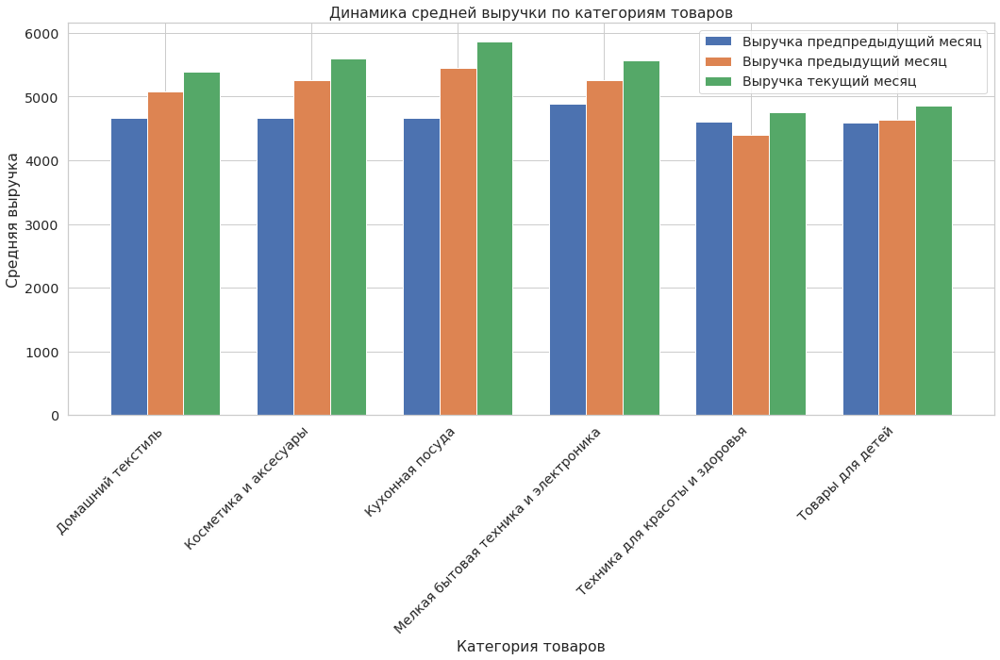

In [162]:
categories = data_diff_by_category['popular_category']

# Построение столбчатой диаграммы для визуализации динамики средней выручки по категориям товаров
fig, ax = plt.subplots(figsize=(15, 10))

# Индексы для каждой категории
index_diff = np.arange(len(categories))

# Построение столбцов для каждого месяца
bars1 = ax.bar(index_diff, data_diff_by_category['3_month'], 0.25, label='Выручка предпредыдущий месяц')
bars2 = ax.bar(index_diff + 0.25, data_diff_by_category['2_month'], 0.25, label='Выручка предыдущий месяц')
bars3 = ax.bar(index_diff + 0.5, data_diff_by_category['1_month'], 0.25, label='Выручка текущий месяц')

# Добавление подписей и заголовка
ax.set_xlabel('Категория товаров')
ax.set_ylabel('Средняя выручка')
ax.set_title('Динамика средней выручки по категориям товаров')
ax.set_xticks(index_diff + 0.25)
ax.set_xticklabels(categories, rotation=45, ha="right")
ax.legend()

plt.tight_layout()
plt.show()

Исходя из получившихся гистограмм, можно смело заявить, что заметен общий тренд роста выручки во всех представленных категориях. В каждой категории товаров наблюдается постепенное увеличение средний выручки от предыдущего месяца к текущему.

В категории "Кухонная посуда" заметен самый наибольший прирост средней выручки, что может говорить о высоком спросе на данный товар и его популярность. 

Категории "Техника для красоты и здоровья" и " Товары для детей" демонстрируют более умеренный рост выручки по сравнению с другими категориями. Это может быть связано с тем, что продукты в этих категориях плохо удовлетворяют текущие потребности и придпочтения ЦА. Также это может быть связано с высокой конкуренцией на рынке данных категорий.

Таким образом, в качестве рекомендаций, компании можно посоветовать изменить свою маркетинговую стратегию для этих категорий товаров. Возможно, как вариант, ввести специальные предложения или акции, которые будут направлены на увелечение интереса к этим категориям среди этих потребителей. Это может вкулючать в себя лимитированные предложния, экспресс-доставку (скидки на доставку), бонусные программы, или даже введение собственных экслюзивных товаров.

Также сдедует изучить отзывы и предпочтения клиентов относительно этих категорий товатов, чтоб адаптировать продуктовое предложение и маркетинговые сообщения к изменяющимся требованиям рынка.

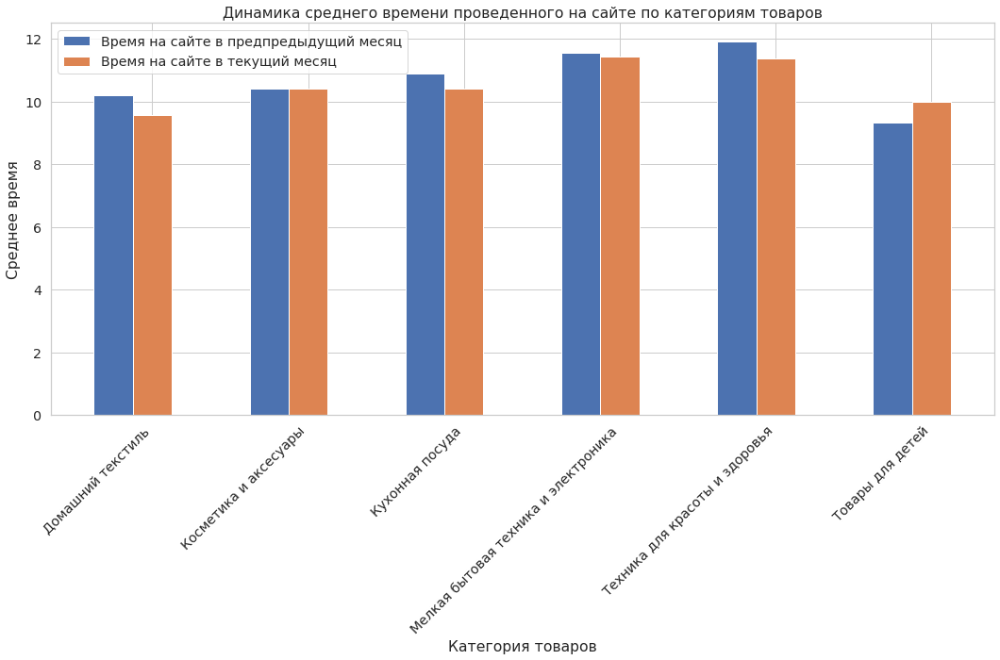

In [163]:
data_time_by_category = data_segment.groupby('popular_category').agg({
    '1_month_time': 'mean',
    '2_month_time': 'mean',
}).reset_index()

# Построим столбчатой диаграммы для визуализации динамики средней выручки по категориям товаров
fig, ax = plt.subplots(figsize=(15, 10))

# Индексы для каждой категории
index_time = np.arange(len(categories))

# Построим столбцов для каждого месяца
bars3 = ax.bar(index_time, data_time_by_category['2_month_time'], 0.25, 
               label='Время на сайте в предпредыдущий месяц')
bars4 = ax.bar(index_time + 0.25, data_time_by_category['1_month_time'], 0.25, 
               label='Время на сайте в текущий месяц')

# Добавим подписей и заголовка
ax.set_xlabel('Категория товаров')
ax.set_ylabel('Среднее время')
ax.set_title('Динамика среднего времени проведенного на сайте по категориям товаров')
ax.set_xticks(index_time + 0.25)
ax.set_xticklabels(categories, rotation=45, ha="right")
ax.legend()

plt.tight_layout()
plt.show()

Исходя из нистограммы по времени проведенном по категориям, можно отметить, что категории "Домашний текстиль", "Кухонная посуда" и "Техника для красоты и здоровья" показывают уменьшение времени, проведённого на сайте, что может свидетельствовать о низкой вовлечённости клиентов в эти категории.

Однако, время не всегда напрямую связано с увеличением продаж. Возможно это может указывать на проблемы удобства использоваться сайта. Если рост времени коррелирует с увеличением продаж, это может можно рассматривать как путь для увеличения прибыли.

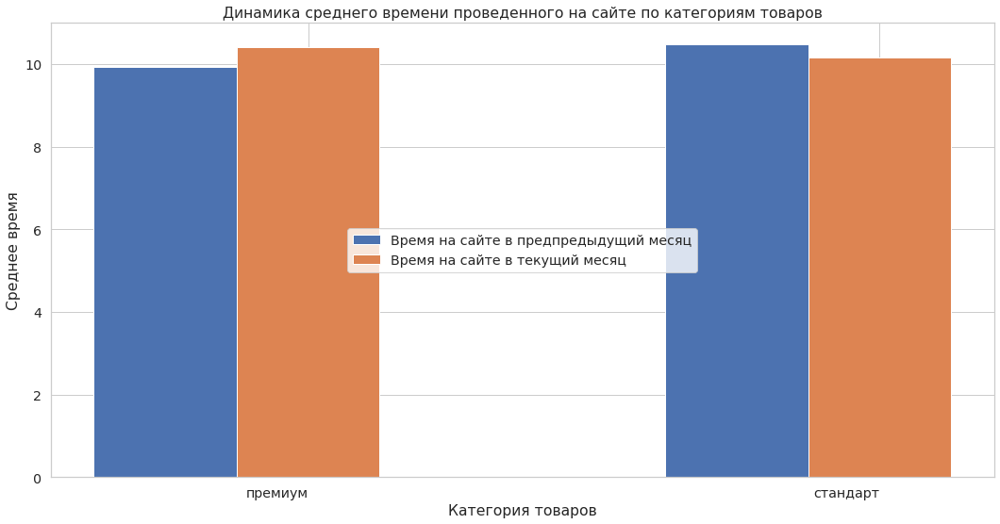

In [164]:
data_sub_by_category = data_segment.groupby('service_type').agg({
    '1_month_time': 'mean',
    '2_month_time': 'mean',
}).reset_index()

categories_sub = data_sub_by_category['service_type']

# Построим столбчатой диаграммы для визуализации динамики средней выручки по категориям товаров
fig, ax = plt.subplots(figsize=(15, 8))

# Индексы для каждой категории
index_sub = np.arange(len(categories_sub))

# Построим столбцов для каждого месяца
bars5 = ax.bar(index_sub, data_sub_by_category['2_month_time'], 0.25, 
               label='Время на сайте в предпредыдущий месяц')
bars6 = ax.bar(index_sub + 0.25, data_sub_by_category['1_month_time'], 0.25, 
               label='Время на сайте в текущий месяц')

# Добавим подписей и заголовка
ax.set_xlabel('Категория товаров')
ax.set_ylabel('Среднее время')
ax.set_title('Динамика среднего времени проведенного на сайте по категориям товаров')
ax.set_xticks(index_sub + 0.25)
ax.set_xticklabels(categories_sub, ha='right')
ax.legend(loc='center')

plt.tight_layout()
plt.show()

Как мы видим на гистограмме, пользователи с подпиской "стандарт" стали меньше времени проводить на сайте. Можно предложить дополнительные привилегии или услуги для улучшения пользовательского опыта.

In [165]:
data_segment.groupby('service_type', as_index=False)[[
    'market_active_6_months',
    'duration'
]].mean()

,service_type,market_active_6_months,duration
0,премиум,3.602083,713.416667
1,стандарт,3.550602,573.373494


В целом маркетинговая активность сбаланирована от типо сервиса.

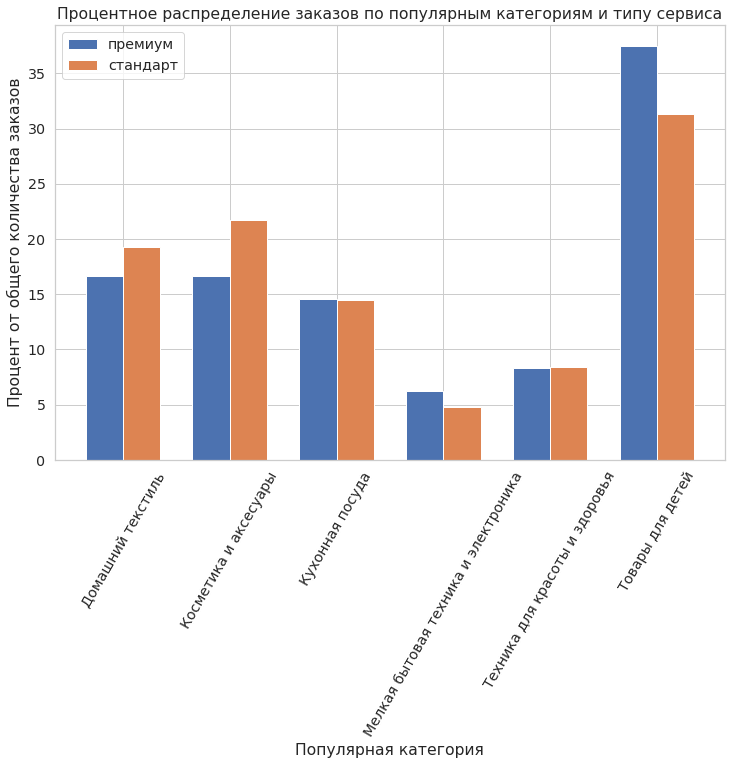

In [166]:
# Сгруппируем данные
grouped_data = data_segment.groupby(['service_type', 'popular_category'], as_index=False)['id'].count()

activities = grouped_data.iloc[:, 0].unique()
categories = grouped_data.iloc[:, 1].unique()
    
# Рассчет общего количества заказов для каждого типа сервиса
total_counts = grouped_data.groupby(grouped_data.columns[0])['id'].transform('sum')

# Определение ширины столбцов и смещения
bar_width = 0.35
index = np.arange(len(categories))
# Построение столбчатой диаграммы
plt.figure(figsize=(12, 8))

for i, activity in enumerate(activities):
    subset = grouped_data[grouped_data.iloc[:, 0] == activity]
    percentages = (subset['id'] / total_counts[subset.index]) * 100
    plt.bar(index + i * bar_width, percentages, bar_width, label=activity)

# Добавление заголовка и подписей к осям
plt.title('Процентное распределение заказов по популярным категориям и типу сервиса')
plt.xlabel('Популярная категория')
plt.ylabel('Процент от общего количества заказов')

# Добавление подписей для каждой популярной категории
plt.xticks(index + bar_width * (len(activities) - 1) / 2, categories, rotation=60)
# Добавление легенды
plt.legend()
# Отображение диаграммы
plt.show()


Самая популярная категория для покупки - Товары для детей. Также заметно, что весь наш сегмент более акцентирован на попуках товаров для детей.

Таким образом, на этапе сегментации покупателей был выделен сегмент из 129 клиентов. Были построены гистограммы сравнения значений в данном сегменте покупателей и покупателей вне этого сегмента. Выявлено, что большая часть клиентов из этого сегмента приносят среднестатистическую прибыль в компании, при этом чаще сталкиваются с ошибками на сервисе, имеют достаточно высокое кол-во неоплаченных товаров в корзине и посещают меньше страниц на сайте. Можно сказать, что клиенты уже знают, что хотят купить.

По маркетинговой активности видно отставание данной группы от остальных пользователей. Нужно увеличить маркетинговую активности для этой сегментированной группы. Также, средний просмотр категории за визит тоже ниже, чем выборке без сегмента. Это может говорить о том, что пользователи уже знают, что купить, когда заходят на сайт.
Можно обратить внимание, что количество неоплаченных продуктов в среднем в 2 раза больше, чем у остальных покупателей. Для того, чтоб изучить этот вопрос, следовало бы изучить какие группы продуктов попадают в неоплаченные товары.

Исходя из информации о страницах за визит, также можно говорить о том, что пользователи знают, что купить, поэтому меньше количество страниц посещают.

И, наконец, выручка предпредыдущий и за предыдущий месяц. Разница зависит от периода. Возможно, акции, которые проводились за те периоды, менее интересовали сегметированную группу клиентов.

Для работы с данными проблемами можно предложить разные стратегии:

1) Сфокусировать рекламные усилия на пользователей с низкой маркетинговой активностью, чтобы попытаться повысить их вовлеченность.

2) Персонализировать предложения.

3) Устранение ошибок сервиса и улучшение навигации, чтобы увеличить количество страниц, просмотренных за визит, и длительность пребывания на сайте.

4) Анализ причин возврата.

5) Анализ выручки (изучение динамики выручки за несколько месяцев может помочь понять, какие периоды являются наиболее и наименее прибыльными).

Далее были изучены данные в разрезе категории товаров и месячной выручки.

В категории "Кухонная посуда" заметен самый наибольший прирост средней выручки, что может говорить о высоком спросе на данный товар и его популярность.

Категории "Техника для красоты и здоровья" и " Товары для детей" демонстрируют более умеренный рост выручки по сравнению с другими категориями. Это может быть связано с тем, что продукты в этих категориях плохо удовлетворяют текущие потребности и придпочтения ЦА. Также это может быть связано с высокой конкуренцией на рынке данных категорий.

Таким образом, в качестве рекомендаций, компании можно посоветовать изменить свою маркетинговую стратегию для этих категорий товаров. Возможно, как вариант, ввести специальные предложения или акции, которые будут направлены на увелечение интереса к этим категориям среди этих потребителей. Это может вкулючать в себя лимитированные предложния, экспресс-доставку (скидки на доставку), бонусные программы, или даже введение собственных экслюзивных товаров.

Также сдедует изучить отзывы и предпочтения клиентов относительно этих категорий товатов, чтоб адаптировать продуктовое предложение и маркетинговые сообщения к изменяющимся требованиям рынка.

Также при изучении данных в разных перспективах было обнаружено, что категории "Домашний текстиль", "Кухонная посуда" и "Техника для красоты и здоровья" показывают уменьшение времени, проведённого на сайте, что может свидетельствовать о низкой вовлечённости клиентов в эти категории. Пользователи с подпиской "стандарт" стали меньше времени проводить на сайте. Можно предложить дополнительные привилегии или услуги для улучшения пользовательского опыта. Самая популярная категория для покупки - Товары для детей. Также заметно, что весь наш сегмент более акцентирован на попуках товаров для детей.

## Общий вывод

На этапе загрузки данных - данные были успешно загружены из четырех файлов с информацией о поведении покупателей на сайте, их коммуникациях, продуктовом поведении и финансовой активности. Также был проведен типов данных и отсутствие пропусков в данных, было проведено переименование столбцов для удобства работы с данными. 

На этапе предобработки данных были изменены и приведены к общепринятому виду названия колонок. Также был исправлен некорректный тип колонок у части датасетов. При проверке на дубликаты и пропуски - все датасеты оказались без них!

На этапе исследовательского анализа был проведен статистический анализ всех признаков. Было выявлено, что есть аномальные значения в выручке. Мы их устранили когда исследовали гистограммы.

Все остальные данные как таковых аномальных выбросов не имеют. Было выявлено, что чаще всего значения маркетинговых комуникаций колеблются в пределах от 3 до 5, а чаще всего маркетинговых компаний было 4 - половина данных. Оставшаяся половина равномерно распределена между 3 и 5. Также чаще всего количество дней с момента регистрации на сайте составляет от 400 до 800 дней. Реже 200 или 1000. Чаще всего пользователи просматривали от 2 до 4 категорий. В показателе с информацией о количестве неоплаченных товар есть выбросы с количеством от 8 до 10. По гистограмме видно, что чаще количество неоплаченных товаров составляет от 1 до 5, остальное реже. Среднее количество ошибок сервиса - от 2 до 5, реже остальные. Выбросов нет. Чаще всего пользователи просматривают от 5 до 12 страниц, и очень редко 15 или больше. Среднее значение проведенного времени на сайте в пределах от 10 до 17 минут, значения больше или меньше - реже. В среднем пользователи приносят от 4500 до 5500 рублей. Однако есть и выбросы с большими значенями, но они не привышают 8000 рублей.

При анализе категориальных показателей было выявлено, что больше 800 пользователей имеют прежний уровень активности, а у всего 500 пользователей - активность снизилась. Количество пользователей с типом сервиса стандарт больше чем в 2 раза больше, чем пользователей с премиумом (850 против почти 400). Чаще (в почти 1000 случая их 1300) пользователи соглашаются о информации о дополнительных товарах. Значений "нет" - около 300. Самая пополуярная категория у пользователей - Товары для детей (около 320 значений). За ними идет домашний текстиль (250 значений) и косметика и аксесуары (220 значений). Распределение равномерно распределено между месяцами, значений по 1300 между периодами. Можно смело говорить о том, что это как раз выручки с каждого пользователя в разрезе 3 месяцев.

На этапе корреляционного анализа была обнаружена сильная корреляция заметна только между 1 месяцем выручки и 2 месяцем выручки, коэфциент составляет 0.88. Можно предположить, что это происходит из-за сильной активности пользователей в последние 2 месяца и их активности. Т.к. коэфициент не выше 0.9 не станем утвержадть что это мультиколинераность. Также есть корреляция между 6 месячной активностью и количеством посещенных страниц (0.32), между количеством страниц и 3 месяцем выручки (0.31), между количеством страниц и 2ым месяцем проведенного времени (0.45). Отрицательная корреляции наблюдается между количеством страниц и акционными покупками (0.36), а также акционными покупками и 2 месяцем проведенного времени (0.33).

На этапе использования пайплайнов было обнаружено, что лучшая модель это модель SVC с коэфициентом C - 1. Метрика ROC-AUC на тестовых данных составляет целых 0.921. На тестовой выборке результат - 0.8635.

На этапе анализа важности признаков была обучена лучшая выбранная модель. Модель SVC с RBF-ядром была успешно обучена, достигнув высоких показателей качества на тренировочной и тестовой выборках.

При построении матрицы ошибок было выявлено, что модель имеет хорошую способность к правильному определению результата. У модели незначительное количество ложно отрицательных результатов, что говорит, что модель хорошо справляется определнием итога.

По классификационному отчету можно заключить, что для отрицательного класса точность (Precision) составляет 0.86, что свидетельствует о том, что модель редко ошибается, когда прогнозирует отрицательный класс. Для положительного класса точность выше - 0.968. Полнота (Recall) для положительного класса выше, чем для отрицательного (0.985 против 0.742), что говорит о том, что модель лучше обнаруживает положительные случаи. F1-мера для положительного класса - 0.84, это сбалансированная мера точности и полноты, и её значение говорит о достаточно хорошем качестве модели. Общая точность (Accuracy) - 0.892, что довольно высоко и указывает на общую эффективность модели в классификации.

Также на данном этапе были отстроены гиперплоскости, границы которых выглядят достатчно оптимально, за исключением некоторых признаков.

И, наконец, была определена важность признаков методом SHAP. Исходя из получившихся результатов, можно сказать, что самыми влияющими на предсказание модели являются признаки: страницы за визит, акционные покупки, время на сайте предыдущий и текущий месяца. Менее значимыми признаками оказались: длительность, активность за 6 месяцев, средний просмотр категорий за визит.

И, наконец, на этапе сегментации пользователей была исследована группа покупателей. Было выявлено, что для данного сегмента самая популярная категория продуктов  - Товары для детей. 

Исходя из исследования и сравнений с пользователями вне этого сегмента было предложено:

1) Сфокусировать рекламные усилия на пользователей с низкой маркетинговой активностью, чтобы попытаться повысить их вовлеченность.

2) Персонализировать предложения.

3) Устранение ошибок сервиса и улучшение навигации, чтобы увеличить количество страниц, просмотренных за визит, и длительность пребывания на сайте.

4) Анализ причин возврата.

5) Анализ выручки (изучение динамики выручки за несколько месяцев может помочь понять, какие периоды являются наиболее и наименее прибыльными).

6) Предложить дополнительные привилегии или услуги для улучшения пользовательского опыта пользователям в завсимости от статуса на сайте.